# 能源生产数据完整分析报告
## Energy Production Data - Complete Analysis Report

---

## 📋 项目概述 (Project Overview)

**研究目标 (Objective)**: 
使用风电（Wind）和水电（Hydroelectric）的发电量来预测其他能源生产的总和（Other_Production）

**目标变量定义 (Target Variable)**:
```
Other_Production = Nuclear + Oil and Gas + Coal + Solar + Biomass
```

**数据特征 (Data Characteristics)**:
- 时间范围：2019年1月1日 至 2025年3月19日
- 时间粒度：每小时（Hourly）
- 总记录数：54,170 条
- 数据完整性：无缺失值

---

## 📚 本 Notebook 内容结构 (Notebook Structure)

本分析报告包含以下完整工作流程：

### 第一部分：数据准备 (Part 1: Data Preparation)
1. **数据加载与预处理** - 加载原始数据，进行数据类型转换和排序
2. **数据基本信息** - 了解数据结构、数据类型和基本统计信息
3. **目标变量创建** - 定义并验证目标变量的正确性

### 第二部分：探索性数据分析 (Part 2: Exploratory Data Analysis)
4. **手动 EDA** - 自定义分析和可视化
   - 描述性统计
   - 时间特征提取
   - 相关性分析
   - 多维度可视化（时间序列、分布、相关性热力图等）
5. **自动化 EDA** - 使用专业工具（ydata-profiling）生成综合报告

### 第三部分：时间序列分析 (Part 3: Time Series Analysis)
6. **季节性分解** - 识别和分解时间序列的季节性模式
7. **去季节化处理** - 创建去季节化变量用于建模

### 第四部分：统计检验 (Part 4: Statistical Tests)
8. **正态性检验** - 检验数据分布是否符合正态分布
9. **相关性显著性检验** - 验证特征与目标变量的相关性
10. **自相关分析** - 分析时间序列的自相关特性

### 第五部分：特征工程 (Part 5: Feature Engineering)
11. **手动特征工程** - 基于领域知识创建特征
    - 滞后特征（Lag Features）
    - 滚动窗口统计（Rolling Statistics）
    - 指数移动平均（EMA）
    - 交互特征（Interaction Features）
    - 时间特征编码（Cyclical Encoding）
12. **自动化特征工程** - 使用 tsfresh 自动提取时间序列特征

### 第六部分：机器学习建模 (Part 6: Machine Learning Modeling)
13. **AutoML 建模** - 使用 AutoGluon 进行自动化机器学习
    - 模型1：手动特征
    - 模型2：自动化特征
    - 模型3：组合特征
14. **模型评估与可视化** - 比较不同模型的性能

### 第七部分：总结 (Part 7: Summary)
15. **分析总结** - 关键发现和结论

---

## ⚠️ 重要说明 (Important Notes)

1. **数据泄露预防 (Data Leakage Prevention)**: 
   - 所有特征工程仅基于 Wind 和 Hydroelectric，不使用目标变量 Other_Production 创建特征
   - 这是为了避免数据泄露，确保模型的泛化能力

2. **时间序列特性 (Time Series Characteristics)**:
   - 数据具有明显的季节性和趋势性
   - 需要考虑时间依赖性，使用适当的交叉验证方法

3. **特征选择 (Feature Selection)**:
   - 手动特征基于领域知识和 EDA 发现
   - 自动化特征使用统计显著性过滤

---

## 🛠️ 技术栈 (Technology Stack)

- **数据处理**: pandas, numpy
- **可视化**: matplotlib, seaborn
- **统计分析**: scipy, statsmodels
- **自动化 EDA**: ydata-profiling
- **特征工程**: tsfresh
- **AutoML**: AutoGluon

---

**开始时间**: 请记录您的分析开始时间  
**预计完成时间**: 根据数据规模和计算资源，完整分析可能需要 30-60 分钟


In [1]:
# ============================================================================
# 库导入 (Library Imports)
# ============================================================================
# 本部分导入分析所需的所有库和模块

# 数据处理库
import pandas as pd  # 数据框操作和数据处理
import numpy as np    # 数值计算和数组操作

# 可视化库
import matplotlib.pyplot as plt  # 基础绘图
import seaborn as sns            # 统计可视化
from mpl_toolkits.mplot3d import Axes3D  # 3D 绘图

# 时间处理
from datetime import datetime

# 系统相关
import os           # 文件系统操作
import warnings     # 警告控制

# 统计分析库
from scipy import stats  # 统计检验和统计函数
from statsmodels.tsa.stattools import acf  # 自相关函数

# 配置设置
warnings.filterwarnings('ignore')  # 忽略警告信息，保持输出整洁

# 设置绘图风格和默认参数
sns.set_style("whitegrid")  # 使用白色网格背景风格
plt.rcParams['figure.figsize'] = (15, 10)  # 设置默认图形大小
plt.rcParams['font.size'] = 10  # 设置默认字体大小

# 中文字体支持（如果需要显示中文）
try:
    plt.rcParams['font.sans-serif'] = ['Arial Unicode MS', 'SimHei', 'DejaVu Sans']
    plt.rcParams['axes.unicode_minus'] = False  # 解决负号显示问题
except:
    pass  # 如果字体设置失败，使用默认字体

print("=" * 60)
print("✓ 所有库导入成功！(All libraries imported successfully!)")
print("=" * 60)
print(f"Pandas version: {pd.__version__}")
print(f"NumPy version: {np.__version__}")
print(f"Matplotlib version: {plt.matplotlib.__version__}")
print(f"Seaborn version: {sns.__version__}")
print("=" * 60)


✓ 所有库导入成功！(All libraries imported successfully!)
Pandas version: 2.3.3
NumPy version: 2.3.3
Matplotlib version: 3.10.1
Seaborn version: 0.13.2


# 第一部分：数据准备 (Part 1: Data Preparation)

---

## 1.1 数据加载 (Data Loading)

**目的 (Purpose)**: 
加载原始数据并进行基本预处理。这是整个分析的基础步骤，确保数据格式正确、时间序列有序，为后续所有分析奠定基础。

**主要步骤 (Main Steps)**:
1. 从 CSV 文件加载数据
2. 将 DateTime 列转换为 datetime 类型
3. 按时间排序，确保时间序列的连续性
4. 检查数据基本信息（形状、时间范围、记录数）

**注意事项 (Notes)**:
- 确保数据文件路径正确
- 检查时间列格式是否正确
- 验证数据完整性（无缺失值）


In [2]:
# ============================================================================
# 1.1.1 加载数据文件
# ============================================================================
# 从 CSV 文件读取能源生产和消费数据
df = pd.read_csv('electricityConsumptionAndProductioction.csv')

print("✓ 数据文件加载成功")
print(f"  原始数据形状: {df.shape} (行数, 列数)")

# ============================================================================
# 1.1.2 数据类型转换
# ============================================================================
# 将 DateTime 列转换为 pandas datetime 类型，便于时间序列分析
df['DateTime'] = pd.to_datetime(df['DateTime'])

# ============================================================================
# 1.1.3 数据排序
# ============================================================================
# 按时间排序，确保时间序列的连续性（这对于时间序列分析至关重要）
df = df.sort_values('DateTime').reset_index(drop=True)

# ============================================================================
# 1.1.4 数据基本信息输出
# ============================================================================
print("\n" + "=" * 60)
print("数据基本信息 (Data Basic Information)")
print("=" * 60)
print(f"数据形状 (Shape): {df.shape[0]:,} 行 × {df.shape[1]} 列")
print(f"时间范围 (Time Range): {df['DateTime'].min()} 至 {df['DateTime'].max()}")
print(f"总记录数 (Total Records): {len(df):,}")
print(f"时间跨度 (Time Span): {(df['DateTime'].max() - df['DateTime'].min()).days} 天")
print("=" * 60)


✓ 数据文件加载成功
  原始数据形状: (54170, 10) (行数, 列数)

数据基本信息 (Data Basic Information)
数据形状 (Shape): 54,170 行 × 10 列
时间范围 (Time Range): 2019-01-01 00:00:00 至 2025-03-19 23:00:00
总记录数 (Total Records): 54,170
时间跨度 (Time Span): 2269 天


## 1.2 数据基本信息 (Basic Information)

**目的 (Purpose)**: 
深入了解数据集的结构、数据类型和基本统计信息。这有助于：
- 识别数据质量问题（缺失值、异常值等）
- 了解各变量的分布特征
- 指导后续分析决策

**检查内容 (Check Items)**:
1. 数据前几行预览 - 查看数据格式和内容
2. 数据类型信息 - 确认各列的数据类型
3. 描述性统计 - 了解数值变量的分布特征
4. 缺失值检查 - 确认数据完整性


In [3]:
# ============================================================================
# 1.2.1 数据预览
# ============================================================================
# 显示数据的前几行，了解数据格式和内容
print("数据前 5 行预览 (First 5 rows):")
print("=" * 60)
df.head()


数据前 5 行预览 (First 5 rows):


,DateTime,Consumption,Production,Nuclear,Wind,Hydroelectric,Oil and Gas,Coal,Solar,Biomass
0,2019-01-01 00:00:00,6352,6527,1395,79,1383,1896,1744,0,30
1,2019-01-01 01:00:00,6116,5701,1393,96,1112,1429,1641,0,30
2,2019-01-01 02:00:00,5873,5676,1393,142,1030,1465,1616,0,30
3,2019-01-01 03:00:00,5682,5603,1397,191,972,1455,1558,0,30
4,2019-01-01 04:00:00,5557,5454,1393,159,960,1454,1458,0,30


In [4]:
# ============================================================================
# 1.2.2 数据类型和结构信息
# ============================================================================
# 显示每列的数据类型、非空值数量、内存使用等信息
print("数据类型和结构信息 (Data Types and Structure):")
print("=" * 60)
df.info()


数据类型和结构信息 (Data Types and Structure):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54170 entries, 0 to 54169
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   DateTime       54170 non-null  datetime64[ns]
 1   Consumption    54170 non-null  int64         
 2   Production     54170 non-null  int64         
 3   Nuclear        54170 non-null  int64         
 4   Wind           54170 non-null  int64         
 5   Hydroelectric  54170 non-null  int64         
 6   Oil and Gas    54170 non-null  int64         
 7   Coal           54170 non-null  int64         
 8   Solar          54170 non-null  int64         
 9   Biomass        54170 non-null  int64         
dtypes: datetime64[ns](1), int64(9)
memory usage: 4.1 MB


In [5]:
# ============================================================================
# 1.2.3 描述性统计
# ============================================================================
# 显示数值变量的描述性统计信息（均值、标准差、最小值、最大值、分位数等）
print("描述性统计摘要 (Descriptive Statistics):")
print("=" * 60)
df.describe()


描述性统计摘要 (Descriptive Statistics):


,DateTime,Consumption,Production,Nuclear,Wind,Hydroelectric,Oil and Gas,Coal,Solar,Biomass
count,54170,54170.000000,54170.000000,54170.000000,54170.000000,54170.000000,54170.000000,54170.000000,54170.000000,54170.000000
mean,2022-02-03 00:21:43.097655552,6526.463688,6380.179989,1282.480377,771.727691,1792.639616,1166.843696,1138.501052,171.808381,54.938859
min,2019-01-01 00:00:00,2922.000000,3119.000000,562.000000,-26.000000,175.000000,195.000000,279.000000,0.000000,17.000000
25%,2020-07-18 06:15:00,5710.000000,5639.000000,1341.000000,228.000000,1281.000000,860.000000,890.000000,0.000000,45.000000
50%,2022-02-02 09:30:00,6474.000000,6322.000000,1378.000000,571.000000,1679.000000,1208.000000,1113.000000,3.000000,55.000000
75%,2023-08-20 15:45:00,7268.000000,7057.750000,1400.000000,1167.000000,2191.000000,1510.000000,1358.000000,302.000000,65.000000
max,2025-03-19 23:00:00,9615.000000,9886.000000,1457.000000,2811.000000,4434.000000,2141.000000,2537.000000,1552.000000,89.000000
std,NaN,1048.248455,1015.393399,241.188791,666.534396,679.983743,433.926493,329.928643,257.257698,13.761794


In [6]:
# ============================================================================
# 1.2.4 缺失值检查
# ============================================================================
# 检查数据中是否存在缺失值，这对于数据质量评估很重要
missing = df.isnull().sum()
print("缺失值统计 (Missing Values Statistics):")
print("=" * 60)
if missing.sum() > 0:
    print("发现缺失值 (Missing values found):")
    print(missing[missing > 0])
    print(f"\n总缺失值数量: {missing.sum()}")
else:
    print("✓ 无缺失值 (No missing values) - 数据完整！")
print("=" * 60)


缺失值统计 (Missing Values Statistics):
✓ 无缺失值 (No missing values) - 数据完整！


## 1.3 创建目标变量 (Create Target Variable)

**目的 (Purpose)**: 
定义我们要预测的目标变量 `Other_Production`（其他能源生产总量）。

**目标变量定义 (Target Variable Definition)**:
```
Other_Production = Nuclear + Oil and Gas + Coal + Solar + Biomass
```

**说明 (Explanation)**:
- 目标变量是除了 Wind（风电）和 Hydroelectric（水电）之外的所有能源生产之和
- 包括：核能（Nuclear）、油气（Oil and Gas）、煤炭（Coal）、太阳能（Solar）、生物质（Biomass）
- 我们将使用 Wind 和 Hydroelectric 作为特征来预测这个目标变量

**验证步骤 (Validation Steps)**:
- 计算目标变量后，验证总产量是否等于所有能源之和
- 检查是否存在数据不一致的情况


In [7]:
# ============================================================================
# 1.3.1 创建目标变量
# ============================================================================
# 计算其他能源生产总量（不包括 Wind 和 Hydroelectric）
df['Other_Production'] = (df['Nuclear'] +           # 核能
                         df['Oil and Gas'] +        # 油气
                         df['Coal'] +              # 煤炭
                         df['Solar'] +             # 太阳能
                         df['Biomass'])            # 生物质

print("✓ 目标变量 Other_Production 创建成功")
print(f"  Other_Production 平均值: {df['Other_Production'].mean():.2f} MW")
print(f"  Other_Production 范围: [{df['Other_Production'].min():.2f}, {df['Other_Production'].max():.2f}] MW")

# ============================================================================
# 1.3.2 数据一致性验证
# ============================================================================
# 验证总产量是否等于所有能源之和（Wind + Hydroelectric + Other_Production）
df['Production_Check'] = (df['Wind'] + df['Hydroelectric'] + df['Other_Production'])
df['Production_Diff'] = abs(df['Production'] - df['Production_Check'])

print("\n" + "=" * 60)
print("数据一致性验证 (Data Consistency Validation)")
print("=" * 60)
print(f"最大差异 (Maximum difference): {df['Production_Diff'].max():.2f} MW")
print(f"平均差异 (Average difference): {df['Production_Diff'].mean():.4f} MW")
print(f"差异 > 1 MW 的记录数: {(df['Production_Diff'] > 1).sum():,} ({(df['Production_Diff'] > 1).sum()/len(df)*100:.2f}%)")

if df['Production_Diff'].max() < 10:
    print("✓ 数据一致性良好 (Good data consistency)")
else:
    print("⚠ 注意：存在一定的数据不一致性，可能是由于四舍五入或数据采集误差")
print("=" * 60)


✓ 目标变量 Other_Production 创建成功
  Other_Production 平均值: 3814.57 MW
  Other_Production 范围: [1483.00, 6221.00] MW

数据一致性验证 (Data Consistency Validation)
最大差异 (Maximum difference): 821.00 MW
平均差异 (Average difference): 3.6449 MW
差异 > 1 MW 的记录数: 23,765 (43.87%)
⚠ 注意：存在一定的数据不一致性，可能是由于四舍五入或数据采集误差


# 第二部分：探索性数据分析 (Part 2: Exploratory Data Analysis)

---

## 2.1 描述性统计 (Descriptive Statistics)

**目的 (Purpose)**: 
了解关键变量的中心趋势、变异性和分布特征。这有助于：
- 识别异常值和离群点
- 理解数据的量级和尺度
- 确定合适的数据预处理步骤
- 为特征工程提供指导

**分析内容 (Analysis Content)**:
- 关键变量的统计摘要（均值、标准差、分位数等）
- 负值检查（可能表示数据质量问题）
- 变量分布特征


In [8]:
# ============================================================================
# 2.1.1 关键变量描述性统计
# ============================================================================
# 分析三个关键变量：Wind（风电）、Hydroelectric（水电）、Other_Production（目标变量）
features = ['Wind', 'Hydroelectric', 'Other_Production']

print("关键变量描述性统计 (Key Variables Descriptive Statistics):")
print("=" * 60)
df[features].describe()


关键变量描述性统计 (Key Variables Descriptive Statistics):


,Wind,Hydroelectric,Other_Production
count,54170.000000,54170.000000,54170.000000
mean,771.727691,1792.639616,3814.572365
std,666.534396,679.983743,685.779885
min,-26.000000,175.000000,1483.000000
25%,228.000000,1281.000000,3393.000000
50%,571.000000,1679.000000,3860.000000
75%,1167.000000,2191.000000,4283.000000
max,2811.000000,4434.000000,6221.000000


In [9]:
# ============================================================================
# 2.1.2 负值检查
# ============================================================================
# 检查是否存在负值（能源生产量理论上不应为负，负值可能表示数据质量问题）
print("负值检查 (Negative Values Check):")
print("=" * 60)
for col in ['Wind', 'Hydroelectric', 'Other_Production', 'Production']:
    neg_count = (df[col] < 0).sum()
    if neg_count > 0:
        print(f"⚠ {col}: 发现 {neg_count} 个负值")
        print(f"  最小值: {df[col].min():.2f}")
        print(f"  负值比例: {neg_count/len(df)*100:.2f}%")
    else:
        print(f"✓ {col}: 无负值")
print("=" * 60)


负值检查 (Negative Values Check):
⚠ Wind: 发现 592 个负值
  最小值: -26.00
  负值比例: 1.09%
✓ Hydroelectric: 无负值
✓ Other_Production: 无负值
✓ Production: 无负值


## 2.2 时间特征提取 (Temporal Feature Analysis)

**目的 (Purpose)**: 
提取基于时间的特征（小时、日期、月份等），这些特征能够捕获：
- 季节性模式（如一天中的小时、一周中的天数、一年中的月份）
- 时间依赖性
- 周期性模式

**重要性 (Importance)**: 
时间特征对于时间序列预测至关重要，帮助模型理解：
- 日内模式（如白天和夜晚的差异）
- 周内模式（工作日 vs 周末）
- 年内模式（季节变化）

**提取的特征 (Extracted Features)**:
- Year（年份）
- Month（月份，1-12）
- Day（日期，1-31）
- Hour（小时，0-23）
- DayOfWeek（星期几，0=周一，6=周日）
- DayOfYear（一年中的第几天，1-365）


In [10]:
# ============================================================================
# 2.2.1 提取时间特征
# ============================================================================
# 从 DateTime 列中提取各种时间维度的特征
df['Year'] = df['DateTime'].dt.year          # 年份
df['Month'] = df['DateTime'].dt.month        # 月份 (1-12)
df['Day'] = df['DateTime'].dt.day            # 日期 (1-31)
df['Hour'] = df['DateTime'].dt.hour         # 小时 (0-23)
df['DayOfWeek'] = df['DateTime'].dt.dayofweek  # 星期几 (0=周一, 6=周日)
df['DayOfYear'] = df['DateTime'].dt.dayofyear  # 一年中的第几天 (1-365)

print("✓ 时间特征提取完成")
print("\n时间范围统计 (Temporal Range Statistics):")
print("=" * 60)
print(f"年份范围 (Years): {sorted(df['Year'].unique())}")
print(f"月份范围 (Months): {sorted(df['Month'].unique())}")
print(f"小时范围 (Hours): {sorted(df['Hour'].unique())}")
print(f"星期几范围 (DayOfWeek): {sorted(df['DayOfWeek'].unique())} (0=周一, 6=周日)")
print("=" * 60)


✓ 时间特征提取完成

时间范围统计 (Temporal Range Statistics):
年份范围 (Years): [np.int32(2019), np.int32(2020), np.int32(2021), np.int32(2022), np.int32(2023), np.int32(2024), np.int32(2025)]
月份范围 (Months): [np.int32(1), np.int32(2), np.int32(3), np.int32(4), np.int32(5), np.int32(6), np.int32(7), np.int32(8), np.int32(9), np.int32(10), np.int32(11), np.int32(12)]
小时范围 (Hours): [np.int32(0), np.int32(1), np.int32(2), np.int32(3), np.int32(4), np.int32(5), np.int32(6), np.int32(7), np.int32(8), np.int32(9), np.int32(10), np.int32(11), np.int32(12), np.int32(13), np.int32(14), np.int32(15), np.int32(16), np.int32(17), np.int32(18), np.int32(19), np.int32(20), np.int32(21), np.int32(22), np.int32(23)]
星期几范围 (DayOfWeek): [np.int32(0), np.int32(1), np.int32(2), np.int32(3), np.int32(4), np.int32(5), np.int32(6)] (0=周一, 6=周日)


## 2.3 相关性分析 (Correlation Analysis)

**目的 (Purpose)**: 
识别特征与目标变量之间的关系。相关性分析有助于：
- 发现与目标变量高度相关的特征（强预测能力）
- 识别特征之间的多重共线性（可能影响模型稳定性）
- 指导特征选择，优先使用相关性强的特征

**分析内容 (Analysis Content)**:
- Pearson 相关系数矩阵
- Wind 和 Hydroelectric 与目标变量 Other_Production 的相关性
- 所有能源类型之间的相关性

**预期发现 (Expected Findings)**:
- Wind 和 Hydroelectric 与 Other_Production 的相关性可能较弱（因为它们不是直接相关的能源类型）
- 但可能存在间接关系或时间模式


In [11]:
# ============================================================================
# 2.3.1 计算相关系数矩阵
# ============================================================================
# 计算所有能源相关变量的 Pearson 相关系数矩阵
corr_cols = ['Wind', 'Hydroelectric', 'Other_Production', 'Production', 
             'Consumption', 'Nuclear', 'Oil and Gas', 'Coal', 'Solar', 'Biomass']
corr_matrix = df[corr_cols].corr()

# ============================================================================
# 2.3.2 关键变量相关性
# ============================================================================
# 重点关注 Wind 和 Hydroelectric 与目标变量 Other_Production 的相关性
print("关键变量相关性矩阵 (Key Variables Correlation Matrix):")
print("=" * 60)
print("Wind 和 Hydroelectric 与目标变量的相关性:")
print(corr_matrix[['Wind', 'Hydroelectric']].loc[['Other_Production', 'Production']])
print("\n解释 (Interpretation):")
print("- 相关系数范围: -1 到 +1")
print("- 接近 +1: 强正相关")
print("- 接近 -1: 强负相关")
print("- 接近 0: 弱相关或无相关")
print("=" * 60)


关键变量相关性矩阵 (Key Variables Correlation Matrix):
Wind 和 Hydroelectric 与目标变量的相关性:
                      Wind  Hydroelectric
Other_Production -0.012846      -0.211050
Production        0.547370       0.426415

解释 (Interpretation):
- 相关系数范围: -1 到 +1
- 接近 +1: 强正相关
- 接近 -1: 强负相关
- 接近 0: 弱相关或无相关


In [12]:
# Display full correlation matrix
corr_matrix


,Wind,Hydroelectric,Other_Production,Production,Consumption,Nuclear,Oil and Gas,Coal,Solar,Biomass
Wind,1.000000,-0.150315,-0.012846,0.547370,0.088225,0.121337,0.061389,-0.098233,-0.131456,0.110086
Hydroelectric,-0.150315,1.000000,-0.211050,0.426415,0.307053,-0.356007,-0.211116,0.076164,0.033727,-0.077416
Other_Production,-0.012846,-0.211050,1.000000,0.526159,0.617960,0.493288,0.766579,0.583660,0.139491,0.415224
Production,0.547370,0.426415,0.526159,1.000000,0.681003,0.173896,0.418187,0.380018,0.030743,0.300670
Consumption,0.088225,0.307053,0.617960,0.681003,1.000000,0.147747,0.494118,0.475399,0.045189,0.382624
Nuclear,0.121337,-0.356007,0.493288,0.173896,0.147747,1.000000,0.280926,0.021643,-0.137071,0.241170
Oil and Gas,0.061389,-0.211116,0.766579,0.418187,0.494118,0.280926,1.000000,0.213912,-0.201225,0.378793
Coal,-0.098233,0.076164,0.583660,0.380018,0.475399,0.021643,0.213912,1.000000,-0.120251,0.234490
Solar,-0.131456,0.033727,0.139491,0.030743,0.045189,-0.137071,-0.201225,-0.120251,1.000000,-0.112378
Biomass,0.110086,-0.077416,0.415224,0.300670,0.382624,0.241170,0.378793,0.234490,-0.112378,1.000000


## 2.4 数据可视化 (Visualization)

**目的 (Purpose)**: 
可视化帮助识别数值统计中不易发现的模式、趋势和异常。可视化对于：
- 发现数据中的隐藏模式
- 验证假设和发现
- 向他人传达分析结果
- 指导后续分析方向

**可视化类型 (Visualization Types)**:
1. 时间序列图 - 观察变量随时间的变化趋势
2. 分布图 - 了解变量的分布特征
3. 相关性热力图 - 直观展示变量间的关系
4. 散点图矩阵 - 探索变量间的两两关系
5. 时间模式分析 - 识别日内、周内、月内模式
6. 能源组成分析 - 了解不同能源的贡献

---

### 2.4.1 时间序列图 (Time Series Plots)

**目的**: 观察 Wind、Hydroelectric 和 Other_Production 随时间的变化趋势，识别：
- 长期趋势
- 季节性模式
- 异常值或突变点


✓ 图表保存目录已创建: eda_plots/
  使用采样数据: 1004 个点（原始数据: 54170 个点）


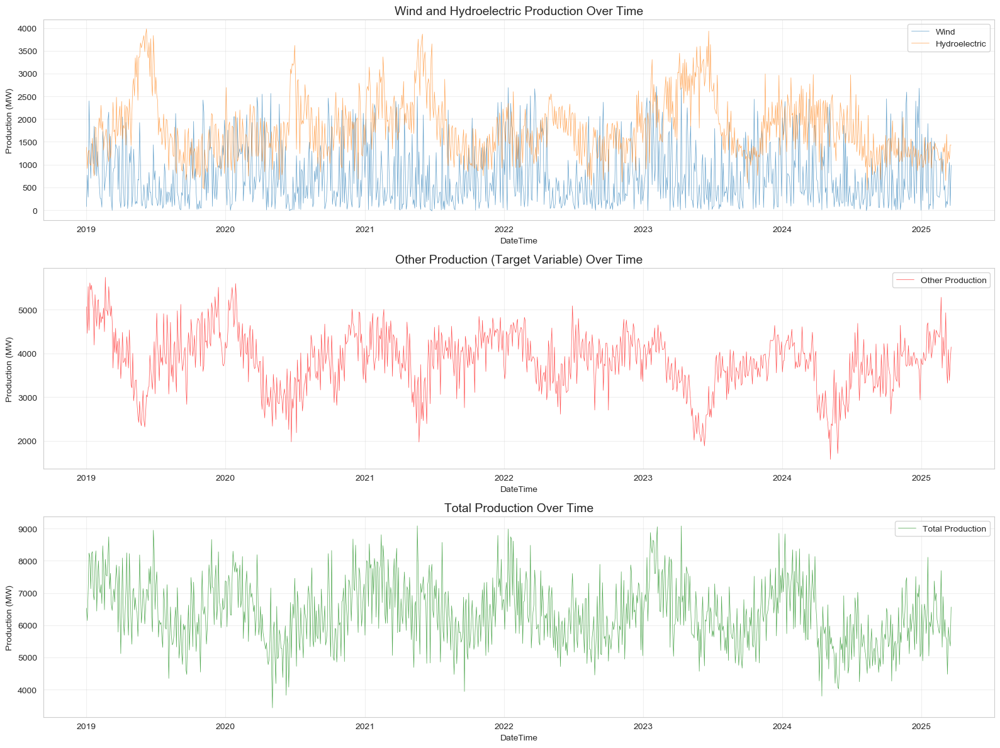

In [13]:
# ============================================================================
# 2.4.1.1 创建图表保存目录
# ============================================================================
# 创建目录用于保存所有生成的图表
os.makedirs('eda_plots', exist_ok=True)
print("✓ 图表保存目录已创建: eda_plots/")

# ============================================================================
# 2.4.1.2 数据采样（如果数据集太大）
# ============================================================================
# 为了可视化性能，如果数据量很大，进行采样
sample_size = min(1000, len(df))
df_sample = df.iloc[::max(1, len(df)//sample_size)]
print(f"  使用采样数据: {len(df_sample)} 个点（原始数据: {len(df)} 个点）")

fig, axes = plt.subplots(3, 1, figsize=(16, 12))

axes[0].plot(df_sample['DateTime'], df_sample['Wind'], label='Wind', alpha=0.7, linewidth=0.5)
axes[0].plot(df_sample['DateTime'], df_sample['Hydroelectric'], label='Hydroelectric', alpha=0.7, linewidth=0.5)
axes[0].set_title('Wind and Hydroelectric Production Over Time', fontsize=14, fontweight='bold')
axes[0].set_xlabel('DateTime')
axes[0].set_ylabel('Production (MW)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(df_sample['DateTime'], df_sample['Other_Production'], label='Other Production', 
             color='red', alpha=0.7, linewidth=0.5)
axes[1].set_title('Other Production (Target Variable) Over Time', fontsize=14, fontweight='bold')
axes[1].set_xlabel('DateTime')
axes[1].set_ylabel('Production (MW)')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

axes[2].plot(df_sample['DateTime'], df_sample['Production'], label='Total Production', 
             color='green', alpha=0.7, linewidth=0.5)
axes[2].set_title('Total Production Over Time', fontsize=14, fontweight='bold')
axes[2].set_xlabel('DateTime')
axes[2].set_ylabel('Production (MW)')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('eda_plots/01_time_series.png', dpi=300, bbox_inches='tight')
plt.show()


### 2.4.2 分布图 (Distribution Plots)

**目的**: 了解变量的分布特征，包括：
- 分布形状（正态、偏态等）
- 集中趋势和离散程度
- 异常值识别

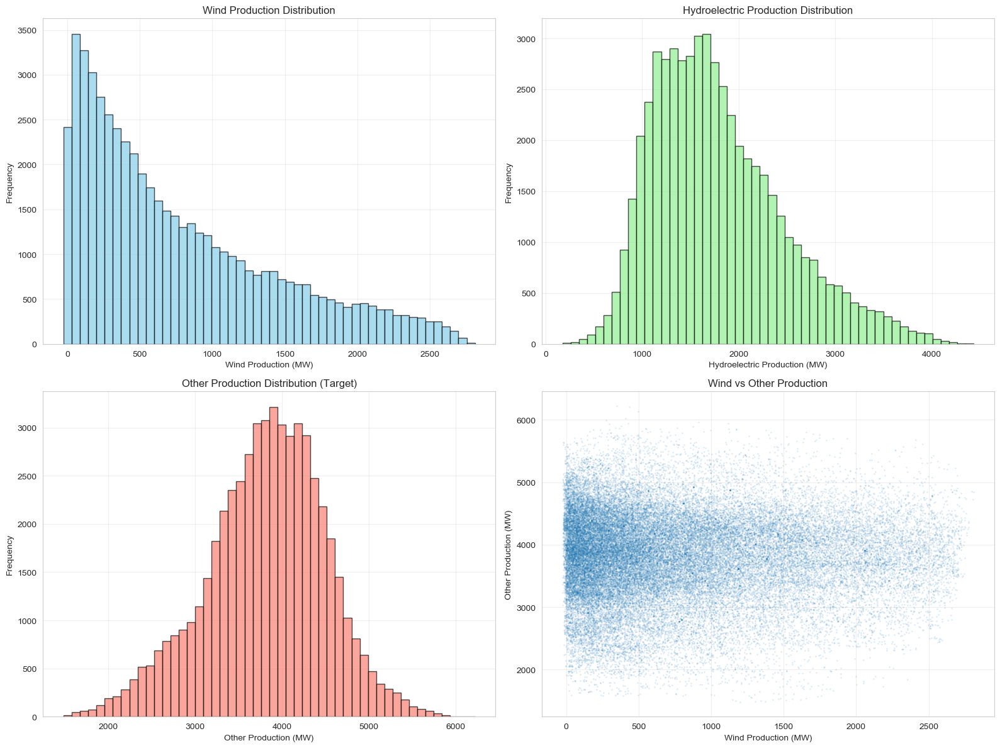

In [14]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

axes[0, 0].hist(df['Wind'], bins=50, alpha=0.7, color='skyblue', edgecolor='black')
axes[0, 0].set_title('Wind Production Distribution', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Wind Production (MW)')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].grid(True, alpha=0.3)

axes[0, 1].hist(df['Hydroelectric'], bins=50, alpha=0.7, color='lightgreen', edgecolor='black')
axes[0, 1].set_title('Hydroelectric Production Distribution', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Hydroelectric Production (MW)')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].grid(True, alpha=0.3)

axes[1, 0].hist(df['Other_Production'], bins=50, alpha=0.7, color='salmon', edgecolor='black')
axes[1, 0].set_title('Other Production Distribution (Target)', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Other Production (MW)')
axes[1, 0].set_ylabel('Frequency')
axes[1, 0].grid(True, alpha=0.3)

axes[1, 1].scatter(df['Wind'], df['Other_Production'], alpha=0.1, s=1)
axes[1, 1].set_title('Wind vs Other Production', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Wind Production (MW)')
axes[1, 1].set_ylabel('Other Production (MW)')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('eda_plots/02_distributions.png', dpi=300, bbox_inches='tight')
plt.show()


### 2.4.3 相关性热力图 (Correlation Heatmap)

**目的**: 直观展示所有变量之间的相关性强度，帮助：
- 快速识别强相关和弱相关的变量对
- 发现多重共线性问题
- 指导特征选择


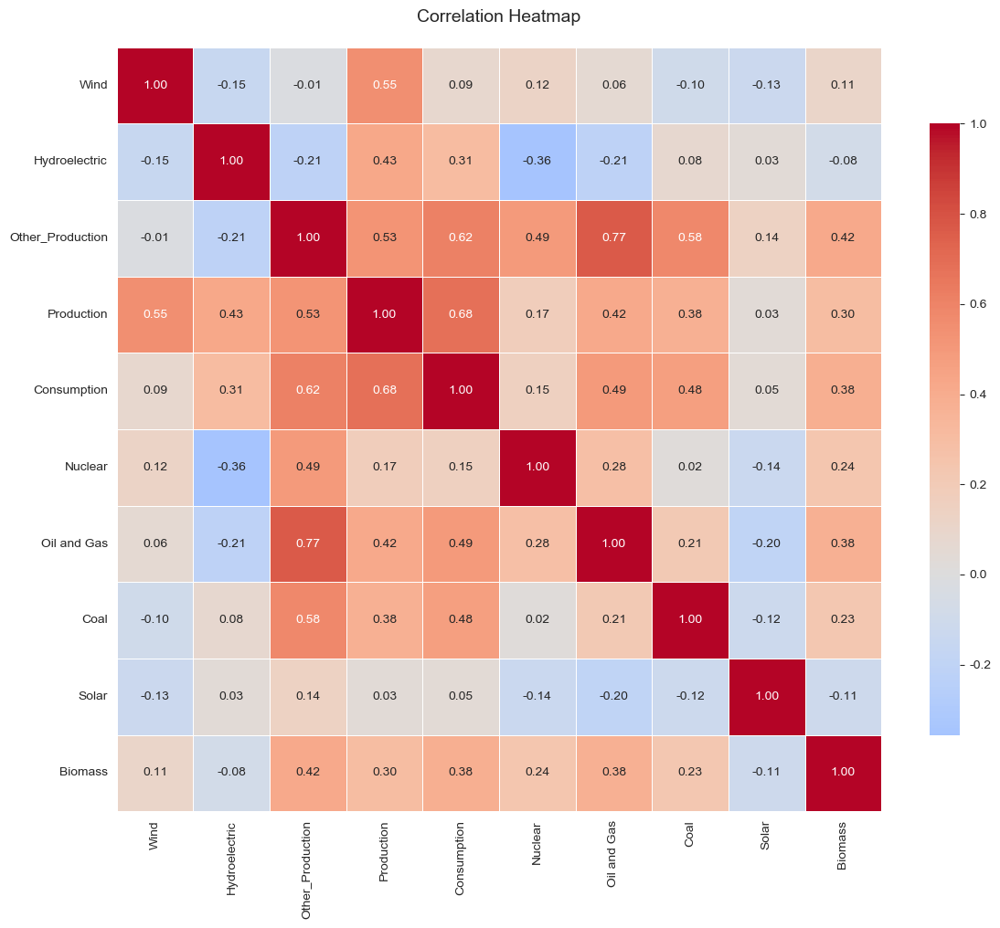

In [15]:
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', center=0,
            square=True, linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=ax)
ax.set_title('Correlation Heatmap', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.savefig('eda_plots/03_correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()


### 2.4.4 散点图矩阵 (Scatter Plot Matrix)

**目的**: 探索变量间的两两关系，包括：
- Wind vs Other_Production
- Hydroelectric vs Other_Production
- Wind vs Hydroelectric
- 3D 散点图展示三维关系


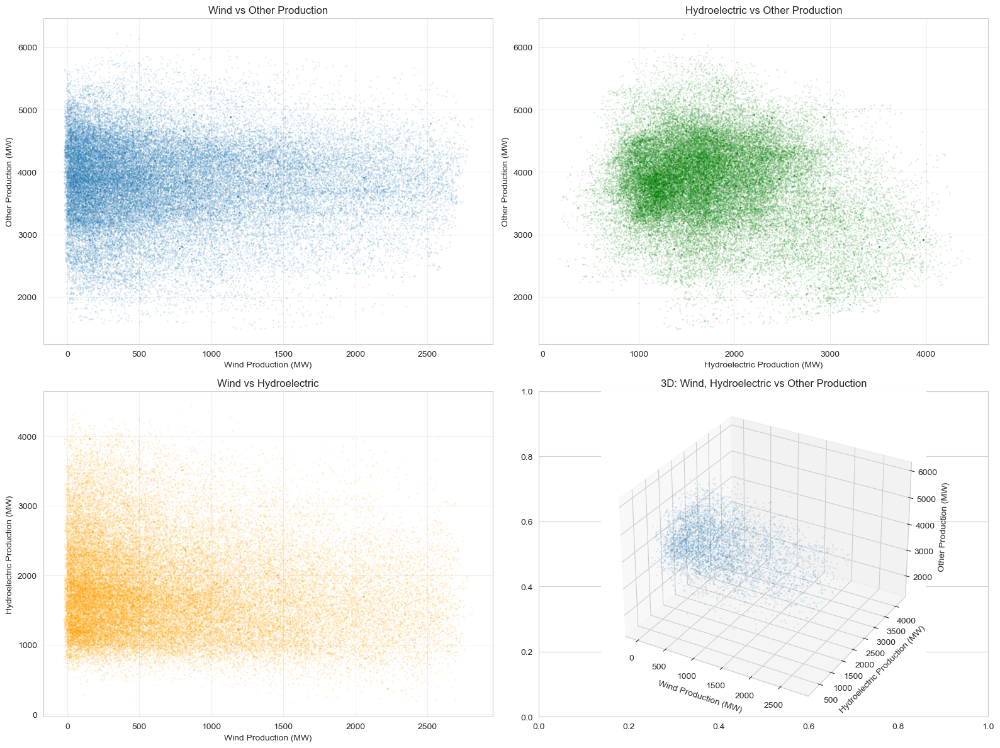

In [16]:
fig = plt.figure(figsize=(16, 12))
axes = fig.subplots(2, 2)

axes[0, 0].scatter(df['Wind'], df['Other_Production'], alpha=0.1, s=1)
axes[0, 0].set_xlabel('Wind Production (MW)')
axes[0, 0].set_ylabel('Other Production (MW)')
axes[0, 0].set_title('Wind vs Other Production', fontweight='bold')
axes[0, 0].grid(True, alpha=0.3)

axes[0, 1].scatter(df['Hydroelectric'], df['Other_Production'], alpha=0.1, s=1, color='green')
axes[0, 1].set_xlabel('Hydroelectric Production (MW)')
axes[0, 1].set_ylabel('Other Production (MW)')
axes[0, 1].set_title('Hydroelectric vs Other Production', fontweight='bold')
axes[0, 1].grid(True, alpha=0.3)

axes[1, 0].scatter(df['Wind'], df['Hydroelectric'], alpha=0.1, s=1, color='orange')
axes[1, 0].set_xlabel('Wind Production (MW)')
axes[1, 0].set_ylabel('Hydroelectric Production (MW)')
axes[1, 0].set_title('Wind vs Hydroelectric', fontweight='bold')
axes[1, 0].grid(True, alpha=0.3)

# 3D散点图
ax_3d = fig.add_subplot(2, 2, 4, projection='3d')
sample_3d = df.sample(min(5000, len(df)))
ax_3d.scatter(sample_3d['Wind'], sample_3d['Hydroelectric'], 
              sample_3d['Other_Production'], alpha=0.1, s=1)
ax_3d.set_xlabel('Wind Production (MW)')
ax_3d.set_ylabel('Hydroelectric Production (MW)')
ax_3d.set_zlabel('Other Production (MW)')
ax_3d.set_title('3D: Wind, Hydroelectric vs Other Production', fontweight='bold')

plt.tight_layout()
plt.savefig('eda_plots/04_scatter_matrix.png', dpi=300, bbox_inches='tight')
plt.show()


### 2.4.5 时间模式分析 (Temporal Patterns Analysis)

**目的**: 识别不同时间维度的模式，包括：
- 日内模式（按小时的平均值）
- 月内模式（按月份的平均值）
- 周内模式（按星期几的平均值）
- 月度分布（箱线图）


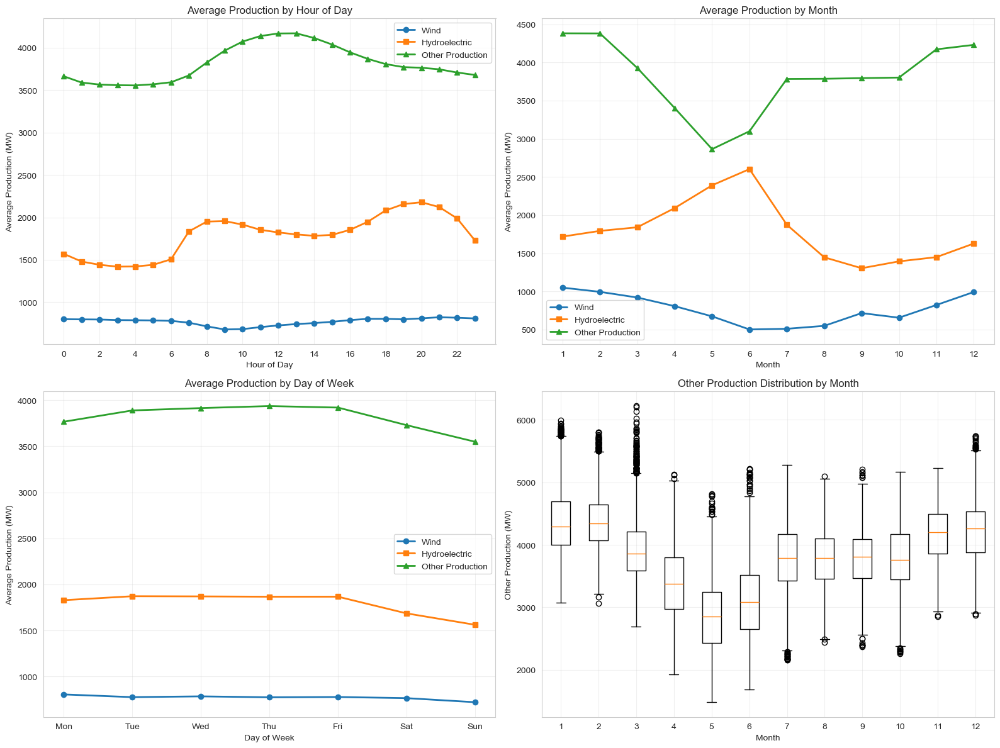

In [17]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 按小时的平均值
hourly_avg = df.groupby('Hour')[['Wind', 'Hydroelectric', 'Other_Production']].mean()
axes[0, 0].plot(hourly_avg.index, hourly_avg['Wind'], marker='o', label='Wind', linewidth=2)
axes[0, 0].plot(hourly_avg.index, hourly_avg['Hydroelectric'], marker='s', label='Hydroelectric', linewidth=2)
axes[0, 0].plot(hourly_avg.index, hourly_avg['Other_Production'], marker='^', label='Other Production', linewidth=2)
axes[0, 0].set_xlabel('Hour of Day')
axes[0, 0].set_ylabel('Average Production (MW)')
axes[0, 0].set_title('Average Production by Hour of Day', fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].set_xticks(range(0, 24, 2))

# 按月份的平均值
monthly_avg = df.groupby('Month')[['Wind', 'Hydroelectric', 'Other_Production']].mean()
axes[0, 1].plot(monthly_avg.index, monthly_avg['Wind'], marker='o', label='Wind', linewidth=2)
axes[0, 1].plot(monthly_avg.index, monthly_avg['Hydroelectric'], marker='s', label='Hydroelectric', linewidth=2)
axes[0, 1].plot(monthly_avg.index, monthly_avg['Other_Production'], marker='^', label='Other Production', linewidth=2)
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('Average Production (MW)')
axes[0, 1].set_title('Average Production by Month', fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].set_xticks(range(1, 13))

# 按星期几的平均值
dow_avg = df.groupby('DayOfWeek')[['Wind', 'Hydroelectric', 'Other_Production']].mean()
dow_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
axes[1, 0].plot(dow_avg.index, dow_avg['Wind'], marker='o', label='Wind', linewidth=2)
axes[1, 0].plot(dow_avg.index, dow_avg['Hydroelectric'], marker='s', label='Hydroelectric', linewidth=2)
axes[1, 0].plot(dow_avg.index, dow_avg['Other_Production'], marker='^', label='Other Production', linewidth=2)
axes[1, 0].set_xlabel('Day of Week')
axes[1, 0].set_ylabel('Average Production (MW)')
axes[1, 0].set_title('Average Production by Day of Week', fontweight='bold')
axes[1, 0].set_xticks(range(7))
axes[1, 0].set_xticklabels(dow_labels)
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# 箱线图：按月份的其他生产量
monthly_data = [df[df['Month'] == month]['Other_Production'].values for month in range(1, 13)]
axes[1, 1].boxplot(monthly_data, labels=range(1, 13))
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('Other Production (MW)')
axes[1, 1].set_title('Other Production Distribution by Month', fontweight='bold')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('eda_plots/05_temporal_patterns.png', dpi=300, bbox_inches='tight')
plt.show()


### 2.4.6 能源组成分析 (Energy Composition Analysis)

**目的**: 了解不同能源类型的组成和贡献，包括：
- 平均能源组成（饼图）
- 能源组成的时间序列（堆叠面积图）
- 各能源类型的分布（箱线图）
- 相关性条形图


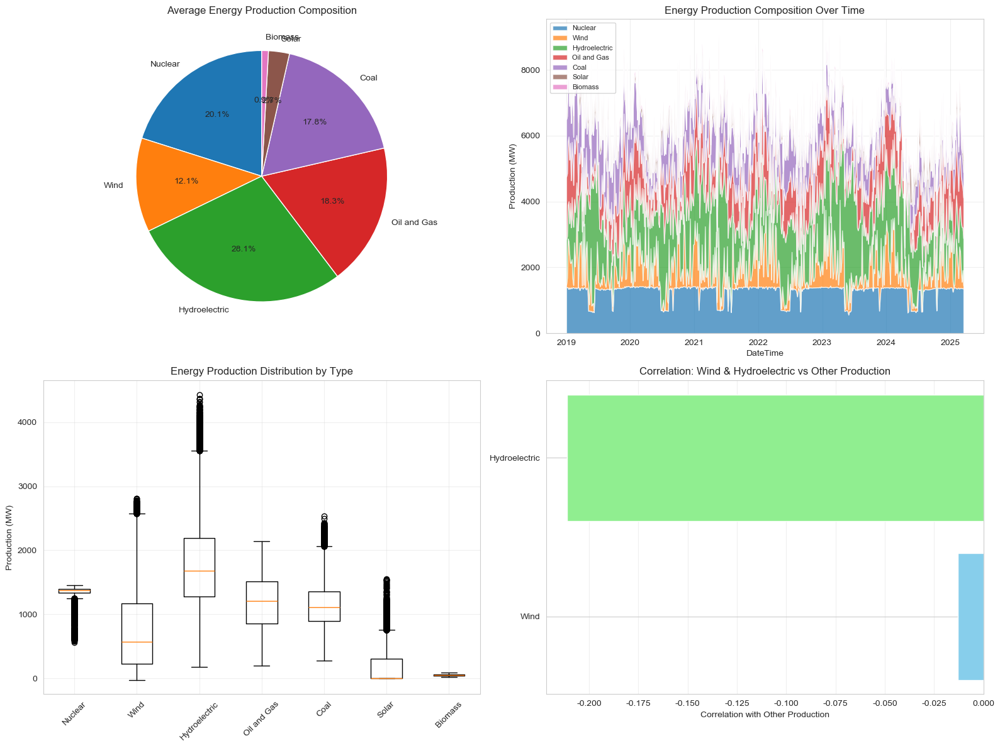

In [18]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 平均能源组成（饼图）
energy_cols = ['Nuclear', 'Wind', 'Hydroelectric', 'Oil and Gas', 'Coal', 'Solar', 'Biomass']
energy_avg = df[energy_cols].mean()
axes[0, 0].pie(energy_avg.values, labels=energy_avg.index, autopct='%1.1f%%', startangle=90)
axes[0, 0].set_title('Average Energy Production Composition', fontweight='bold', fontsize=12)

# 能源组成的时间序列（堆叠面积图）
sample_size = min(500, len(df))
df_sample2 = df.iloc[::max(1, len(df)//sample_size)].copy()
axes[0, 1].stackplot(df_sample2['DateTime'], 
                     df_sample2['Nuclear'],
                     df_sample2['Wind'],
                     df_sample2['Hydroelectric'],
                     df_sample2['Oil and Gas'],
                     df_sample2['Coal'],
                     df_sample2['Solar'],
                     df_sample2['Biomass'],
                     labels=energy_cols, alpha=0.7)
axes[0, 1].set_title('Energy Production Composition Over Time', fontweight='bold')
axes[0, 1].set_xlabel('DateTime')
axes[0, 1].set_ylabel('Production (MW)')
axes[0, 1].legend(loc='upper left', fontsize=8)
axes[0, 1].grid(True, alpha=0.3)

# 各能源的箱线图
energy_data = [df[col].values for col in energy_cols]
axes[1, 0].boxplot(energy_data, labels=energy_cols)
axes[1, 0].set_title('Energy Production Distribution by Type', fontweight='bold')
axes[1, 0].set_ylabel('Production (MW)')
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True, alpha=0.3)

# 相关性条形图（Wind和Hydroelectric与其他变量的相关性）
corr_with_target = corr_matrix[['Wind', 'Hydroelectric']].loc[['Other_Production']].T
axes[1, 1].barh(corr_with_target.index, corr_with_target['Other_Production'], color=['skyblue', 'lightgreen'])
axes[1, 1].set_xlabel('Correlation with Other Production')
axes[1, 1].set_title('Correlation: Wind & Hydroelectric vs Other Production', fontweight='bold')
axes[1, 1].grid(True, alpha=0.3, axis='x')
axes[1, 1].axvline(x=0, color='black', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.savefig('eda_plots/06_energy_composition.png', dpi=300, bbox_inches='tight')
plt.show()


# 第三部分：自动化 EDA (Part 3: Automated EDA)

---

**目的 (Purpose)**: 
使用专业的自动化 EDA 工具快速生成综合报告。这些工具能够：
- 识别手动分析可能遗漏的模式和相关性
- 发现数据质量问题
- 提供标准化的数据视图
- 生成交互式可视化报告

**优势 (Advantages)**:
- 快速全面：几分钟内生成完整报告
- 标准化：统一的报告格式
- 交互式：可交互探索数据
- 详细统计：包含丰富的统计信息

---

## 3.1 使用 ydata-profiling (Using ydata-profiling)

**目的 (Purpose)**: 
生成包含以下内容的综合自动化 EDA 报告：
- 详细的统计摘要
- 变量间的相关性分析
- 缺失值模式识别
- 交互式可视化
- 数据质量评估

**输出 (Output)**: 
生成 HTML 格式的交互式报告，保存在 `eda_plots/automated_report_ydata_profiling.html`


In [19]:

#Prepare data for automated EDA
# Select key columns for automated analysis
key_cols = ['DateTime', 'Wind', 'Hydroelectric', 'Other_Production', 
            'Production', 'Consumption', 'Year', 'Month', 'Hour', 'DayOfWeek']
df_eda = df[key_cols].copy()

# Method 1: Using ydata-profiling
try:
    from ydata_profiling import ProfileReport
    
    print("Generating ydata-profiling report... (This may take a few minutes)")
    profile = ProfileReport(
        df_eda,
        title="Energy Production Data EDA Report",
        explorative=True,
        minimal=False,
        correlations={
            "pearson": {"calculate": True},
            "spearman": {"calculate": True},
            "kendall": {"calculate": True},
        },
        interactions={"continuous": True},
        missing_diagrams={"bar": True, "matrix": True, "heatmap": True},
        duplicates={"head": 10},
    )
    
    profile.to_file("eda_plots/automated_report_ydata_profiling.html")
    print("✓ Report saved to: eda_plots/automated_report_ydata_profiling.html")
    display(profile)
except ImportError:
    print("✗ ydata-profiling not installed. Install with: pip install ydata-profiling")
except Exception as e:
    print(f"✗ Error generating report: {e}")


Generating ydata-profiling report... (This may take a few minutes)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████| 10/10 [00:00<00:00, 662.38it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

✓ Report saved to: eda_plots/automated_report_ydata_profiling.html


# 第四部分：时间序列分析 (Part 4: Time Series Analysis)

---

## 4.1 季节性分解 (Seasonal Decomposition)

**目的 (Purpose)**: 
将时间序列分解为趋势（Trend）、季节性（Seasonal）和残差（Residual）三个组成部分。这有助于：
- 理解季节性的本质和强度
- 识别长期趋势
- 为创建去季节化变量做准备

**分解模型 (Decomposition Model)**:
- **加法模型 (Additive)**: `Observed = Trend + Seasonal + Residual`
- 适用于季节性幅度不随时间变化的序列

**分解周期 (Decomposition Periods)**:
- **日周期 (Daily)**: period=24（24小时 = 1天）
- **周周期 (Weekly)**: period=168（168小时 = 7天 × 24小时）

**重要说明 (Important Note)**: 
⚠️ 只对特征变量（Wind 和 Hydroelectric）进行去季节化，不对目标变量（Other_Production）进行去季节化，以避免数据泄露。


In [20]:
# ============================================================================
# 4.1.1 导入季节性分解库
# ============================================================================
from statsmodels.tsa.seasonal import seasonal_decompose

# ============================================================================
# 4.1.2 执行季节性分解
# ============================================================================
print("执行季节性分解 (Performing seasonal decomposition)...")
print("=" * 60)

# Variables to decompose
variables = ['Wind', 'Hydroelectric', 'Other_Production']
decompositions = {}

# Perform decomposition for each variable
# For hourly data: period=24 (daily), period=168 (weekly)
for var in variables:
    print(f"\nDecomposing {var}...")
    
    # Daily seasonality (24 hours)
    try:
        decomp_daily = seasonal_decompose(
            df[var].dropna(), 
            model='additive', 
            period=24,  # 24 hours = 1 day
            extrapolate_trend='freq'
        )
        decompositions[f'{var}_daily'] = decomp_daily
        print(f"  Daily decomposition completed (period=24)")
    except Exception as e:
        print(f"  Daily decomposition failed: {e}")
        decompositions[f'{var}_daily'] = None
    
    # Weekly seasonality (168 hours = 7 days * 24 hours)
    try:
        decomp_weekly = seasonal_decompose(
            df[var].dropna(), 
            model='additive', 
            period=168,  # 168 hours = 1 week
            extrapolate_trend='freq'
        )
        decompositions[f'{var}_weekly'] = decomp_weekly
        print(f"  Weekly decomposition completed (period=168)")
    except Exception as e:
        print(f"  Weekly decomposition failed: {e}")
        decompositions[f'{var}_weekly'] = None

print("\n✓ Seasonal decomposition completed!")


执行季节性分解 (Performing seasonal decomposition)...

Decomposing Wind...
  Daily decomposition completed (period=24)
  Weekly decomposition completed (period=168)

Decomposing Hydroelectric...
  Daily decomposition completed (period=24)
  Weekly decomposition completed (period=168)

Decomposing Other_Production...
  Daily decomposition completed (period=24)
  Weekly decomposition completed (period=168)

✓ Seasonal decomposition completed!


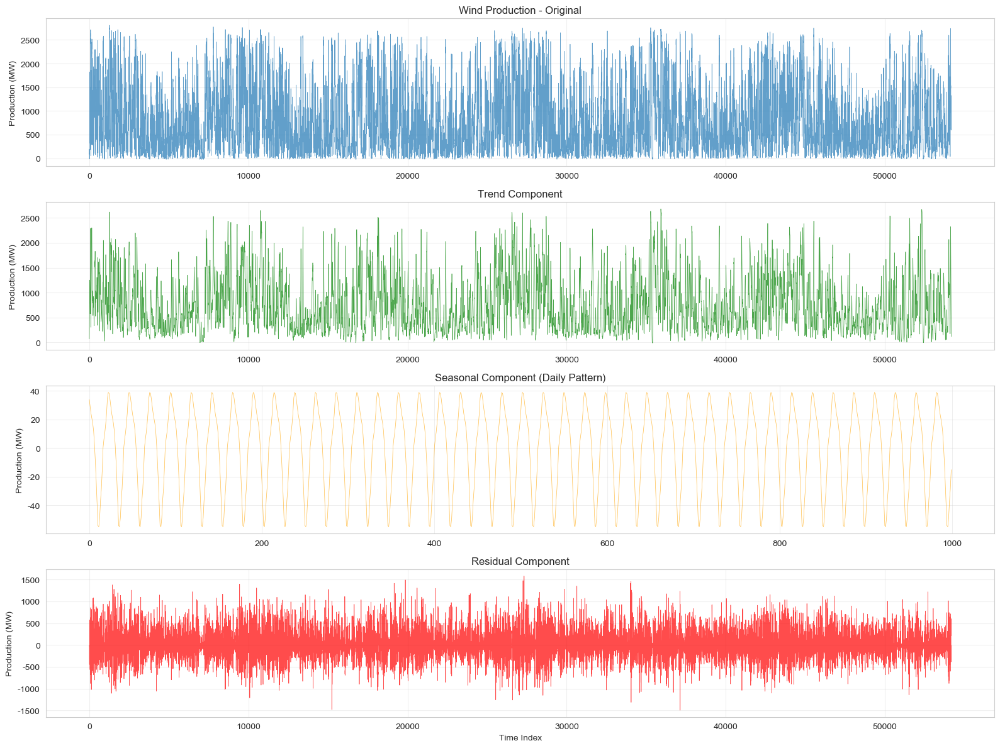

✓ Seasonal decomposition visualization saved to eda_plots/07_seasonal_decomposition.png


In [21]:
# Visualize seasonal decomposition components
# Plot decomposition for Wind (daily) as an example
if 'Wind_daily' in decompositions and decompositions['Wind_daily'] is not None:
    fig, axes = plt.subplots(4, 1, figsize=(16, 12))
    decomp = decompositions['Wind_daily']
    
    # Original
    axes[0].plot(decomp.observed, alpha=0.7, linewidth=0.5)
    axes[0].set_title('Wind Production - Original', fontweight='bold')
    axes[0].set_ylabel('Production (MW)')
    axes[0].grid(True, alpha=0.3)
    
    # Trend
    axes[1].plot(decomp.trend, alpha=0.7, linewidth=0.5, color='green')
    axes[1].set_title('Trend Component', fontweight='bold')
    axes[1].set_ylabel('Production (MW)')
    axes[1].grid(True, alpha=0.3)
    
    # Seasonal
    sample_size = min(1000, len(decomp.seasonal))
    axes[2].plot(decomp.seasonal.iloc[:sample_size], alpha=0.7, linewidth=0.5, color='orange')
    axes[2].set_title('Seasonal Component (Daily Pattern)', fontweight='bold')
    axes[2].set_ylabel('Production (MW)')
    axes[2].grid(True, alpha=0.3)
    
    # Residual
    axes[3].plot(decomp.resid, alpha=0.7, linewidth=0.5, color='red')
    axes[3].set_title('Residual Component', fontweight='bold')
    axes[3].set_ylabel('Production (MW)')
    axes[3].set_xlabel('Time Index')
    axes[3].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('eda_plots/07_seasonal_decomposition.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print("✓ Seasonal decomposition visualization saved to eda_plots/07_seasonal_decomposition.png")
else:
    print("⚠ Wind daily decomposition not available for visualization")


In [22]:
# Create deseasonalized variables
print("Creating deseasonalized variables...")
print("NOTE: Only creating deseasonalized features for Wind and Hydroelectric (NOT for Other_Production to avoid data leakage)")

# IMPORTANT: Only create deseasonalized features for Wind and Hydroelectric, NOT for Other_Production
# Other_Production is the target variable, so we should not use its deseasonalized version as a feature
feature_variables = ['Wind', 'Hydroelectric']  # Only Wind and Hydroelectric, NOT Other_Production

for var in feature_variables:
    if f'{var}_daily' in decompositions and decompositions[f'{var}_daily'] is not None:
        decomp = decompositions[f'{var}_daily']
        
        # Get the indices where decomposition was performed
        valid_idx = decomp.observed.index
        
        # Initialize deseasonalized columns
        df.loc[valid_idx, f'{var}_deseasonalized'] = decomp.trend + decomp.resid  # Original - Seasonal
        df.loc[valid_idx, f'{var}_trend'] = decomp.trend
        df.loc[valid_idx, f'{var}_seasonal'] = decomp.seasonal
        df.loc[valid_idx, f'{var}_residual'] = decomp.resid
        
        print(f"  ✓ Created deseasonalized features for {var}")
    else:
        print(f"  ✗ Could not create deseasonalized features for {var} (decomposition failed)")

# Remove any Other_Production deseasonalized features if they were created earlier (data leakage prevention)
other_prod_deseas = [col for col in df.columns if 'Other_Production' in col and any(x in col for x in ['_deseasonalized', '_trend', '_seasonal', '_residual'])]
if len(other_prod_deseas) > 0:
    print(f"\n  ⚠ Removing {len(other_prod_deseas)} Other_Production deseasonalized features (data leakage prevention):")
    for col in other_prod_deseas:
        print(f"    - {col}")
    df = df.drop(columns=other_prod_deseas)

print("\n✓ Deseasonalized variables created!")
print(f"\nNew columns created (Wind and Hydroelectric only):")
deseasonalized_cols = [col for col in df.columns if any(x in col for x in ['_deseasonalized', '_trend', '_seasonal', '_residual']) and 'Other_Production' not in col]
print(f"  Total: {len(deseasonalized_cols)} columns")
for col in deseasonalized_cols[:10]:  # Show first 10
    print(f"    - {col}")
if len(deseasonalized_cols) > 10:
    print(f"    ... and {len(deseasonalized_cols) - 10} more")


Creating deseasonalized variables...
NOTE: Only creating deseasonalized features for Wind and Hydroelectric (NOT for Other_Production to avoid data leakage)
  ✓ Created deseasonalized features for Wind
  ✓ Created deseasonalized features for Hydroelectric

✓ Deseasonalized variables created!

New columns created (Wind and Hydroelectric only):
  Total: 8 columns
    - Wind_deseasonalized
    - Wind_trend
    - Wind_seasonal
    - Wind_residual
    - Hydroelectric_deseasonalized
    - Hydroelectric_trend
    - Hydroelectric_seasonal
    - Hydroelectric_residual


In [23]:
# Compare correlations: Original vs Deseasonalized
print("Comparing correlations: Original vs Deseasonalized")
print("=" * 60)

# Original correlations
wind_corr_orig, wind_p_orig = stats.pearsonr(
    df['Wind'].dropna(), 
    df['Other_Production'].dropna()
)
hydro_corr_orig, hydro_p_orig = stats.pearsonr(
    df['Hydroelectric'].dropna(), 
    df['Other_Production'].dropna()
)

print("\nOriginal Correlations:")
print(f"  Wind vs Other_Production: r = {wind_corr_orig:.4f}, p = {wind_p_orig:.4f}")
print(f"  Hydroelectric vs Other_Production: r = {hydro_corr_orig:.4f}, p = {hydro_p_orig:.4f}")

# Deseasonalized correlations (if available)
if 'Wind_deseasonalized' in df.columns and 'Other_Production_deseasonalized' in df.columns:
    wind_corr_deseas, wind_p_deseas = stats.pearsonr(
        df['Wind_deseasonalized'].dropna(), 
        df['Other_Production_deseasonalized'].dropna()
    )
    hydro_corr_deseas, hydro_p_deseas = stats.pearsonr(
        df['Hydroelectric_deseasonalized'].dropna(), 
        df['Other_Production_deseasonalized'].dropna()
    )
    
    print("\nDeseasonalized Correlations:")
    print(f"  Wind_deseasonalized vs Other_Production_deseasonalized: r = {wind_corr_deseas:.4f}, p = {wind_p_deseas:.4f}")
    print(f"  Hydroelectric_deseasonalized vs Other_Production_deseasonalized: r = {hydro_corr_deseas:.4f}, p = {hydro_p_deseas:.4f}")
    
    print("\nCorrelation Changes:")
    print(f"  Wind: {wind_corr_orig:.4f} → {wind_corr_deseas:.4f} (change: {wind_corr_deseas - wind_corr_orig:+.4f})")
    print(f"  Hydroelectric: {hydro_corr_orig:.4f} → {hydro_corr_deseas:.4f} (change: {hydro_corr_deseas - hydro_corr_orig:+.4f})")
else:
    print("\n⚠ Deseasonalized variables not available for correlation comparison")

print("\n✓ Correlation comparison completed!")


Comparing correlations: Original vs Deseasonalized

Original Correlations:
  Wind vs Other_Production: r = -0.0128, p = 0.0028
  Hydroelectric vs Other_Production: r = -0.2111, p = 0.0000

⚠ Deseasonalized variables not available for correlation comparison

✓ Correlation comparison completed!


## 4.3 Create Deseasonalized Variables

**Purpose**: Create deseasonalized versions of key variables by removing seasonal components. These variables can be used in modeling to focus on relationships between variables rather than seasonal patterns.


## 4.4 Compare Correlations: Original vs Deseasonalized

**Purpose**: Compare correlations before and after deseasonalization to see if removing seasonality reveals stronger relationships between variables. This helps determine whether deseasonalization improves predictive power.


In [24]:
# Normality test (Shapiro-Wilk test, sample size limited to 5000)
print("Normality test results:")
for col in ['Wind', 'Hydroelectric', 'Other_Production']:
    sample = df[col].sample(min(5000, len(df)))
    stat, p_value = stats.shapiro(sample)
    print(f"{col}: statistic={stat:.4f}, p-value={p_value:.4f}, "
          f"{'Normal' if p_value > 0.05 else 'Not Normal'}")


Normality test results:
Wind: statistic=0.9022, p-value=0.0000, Not Normal
Hydroelectric: statistic=0.9599, p-value=0.0000, Not Normal
Other_Production: statistic=0.9940, p-value=0.0000, Not Normal


In [25]:
# Correlation significance tests
wind_corr, wind_p = stats.pearsonr(df['Wind'], df['Other_Production'])
hydro_corr, hydro_p = stats.pearsonr(df['Hydroelectric'], df['Other_Production'])

print(f"Wind vs Other_Production:")
print(f"  Correlation coefficient r = {wind_corr:.4f}")
print(f"  p-value = {wind_p:.4f}")
print(f"  Significance: {'Significant' if wind_p < 0.05 else 'Not significant'}\n")

print(f"Hydroelectric vs Other_Production:")
print(f"  Correlation coefficient r = {hydro_corr:.4f}")
print(f"  p-value = {hydro_p:.4f}")
print(f"  Significance: {'Significant' if hydro_p < 0.05 else 'Not significant'}")


Wind vs Other_Production:
  Correlation coefficient r = -0.0128
  p-value = 0.0028
  Significance: Significant

Hydroelectric vs Other_Production:
  Correlation coefficient r = -0.2111
  p-value = 0.0000
  Significance: Significant


## 4.3 Autocorrelation Analysis (Time Series)

**Purpose**: Measure how strongly a variable is correlated with its past values. High autocorrelation indicates strong temporal dependencies, which is important for time series modeling. This helps determine appropriate lag features and time series model types.


In [35]:
# Autocorrelation analysis (lag=1, 24, 168 for hourly data)
lags = [1, 24, 168]  # 1 hour, 24 hours (1 day), 168 hours (1 week)

for col in ['Wind', 'Hydroelectric', 'Other_Production']:
    autocorr = acf(df[col], nlags=max(lags), fft=True)
    print(f"\n{col} autocorrelation:")
    for lag in lags:
        if lag < len(autocorr):
            lag_name = '1 hour' if lag == 1 else '1 day' if lag == 24 else '1 week'
            print(f"  Lag {lag} ({lag_name}): {autocorr[lag]:.4f}")



Wind autocorrelation:
  Lag 1 (1 hour): 0.9766
  Lag 24 (1 day): 0.3127
  Lag 168 (1 week): 0.1150

Hydroelectric autocorrelation:
  Lag 1 (1 hour): 0.9648
  Lag 24 (1 day): 0.8741
  Lag 168 (1 week): 0.8169

Other_Production autocorrelation:
  Lag 1 (1 hour): 0.9853
  Lag 24 (1 day): 0.8834
  Lag 168 (1 week): 0.7943


# 5. Feature Engineering

**Purpose**: Create additional features that can improve model performance. Feature engineering transforms raw data into informative features that help machine learning models learn patterns more effectively. Good features can significantly improve prediction accuracy. This step comes after statistical tests to ensure we understand the data before creating features.

## 5.1 Manual Feature Engineering

**Purpose**: Manually create domain-specific features based on understanding of the problem. These features capture temporal patterns, interactions, and statistical properties that are known to be important for time series prediction.


In [27]:
# Comprehensive Manual Feature Engineering
# IMPORTANT: Only use Wind and Hydroelectric to predict Other_Production
# Do NOT create features from Other_Production to avoid data leakage
print("=" * 60)
print("Manual Feature Engineering")
print("=" * 60)
print("\nCreating comprehensive manual features from Wind and Hydroelectric only...")
print("Note: No features are created from Other_Production to prevent data leakage.")

# ============================================================================
# 0. Remove any existing features created from Other_Production (data leakage prevention)
# ============================================================================
print("\n0. Removing any existing features created from Other_Production...")
other_prod_features = [col for col in df.columns if 'Other_Production' in col and col != 'Other_Production']
if len(other_prod_features) > 0:
    print(f"  ⚠ Found {len(other_prod_features)} features created from Other_Production (data leakage!):")
    for feat in other_prod_features[:10]:  # Show first 10
        print(f"    - {feat}")
    if len(other_prod_features) > 10:
        print(f"    ... and {len(other_prod_features) - 10} more")
    df = df.drop(columns=other_prod_features)
    print(f"  ✓ Removed {len(other_prod_features)} features to prevent data leakage")
else:
    print("  ✓ No features created from Other_Production found (good!)")

# ============================================================================
# 1. Lag Features (Previous Time Steps)
# ============================================================================
print("\n1. Creating lag features...")
lag_periods = [1, 2, 3, 6, 12, 24, 48, 72, 168]  # 1h to 1 week
for lag in lag_periods:
    df[f'Wind_lag_{lag}'] = df['Wind'].shift(lag)
    df[f'Hydroelectric_lag_{lag}'] = df['Hydroelectric'].shift(lag)
    # NOTE: Do NOT create lag features for Other_Production (target variable)
print(f"  ✓ Created {len(lag_periods) * 2} lag features (Wind and Hydroelectric only)")

# ============================================================================
# 2. Rolling Window Statistics
# ============================================================================
print("\n2. Creating rolling window statistics...")
rolling_windows = [3, 6, 12, 24, 48, 72, 168]  # 3h to 1 week
for window in rolling_windows:
    # Mean
    df[f'Wind_rolling_mean_{window}'] = df['Wind'].rolling(window=window, min_periods=1).mean()
    df[f'Hydroelectric_rolling_mean_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).mean()
    # Std
    df[f'Wind_rolling_std_{window}'] = df['Wind'].rolling(window=window, min_periods=1).std()
    df[f'Hydroelectric_rolling_std_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).std()
    # Max
    df[f'Wind_rolling_max_{window}'] = df['Wind'].rolling(window=window, min_periods=1).max()
    df[f'Hydroelectric_rolling_max_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).max()
    # Min
    df[f'Wind_rolling_min_{window}'] = df['Wind'].rolling(window=window, min_periods=1).min()
    df[f'Hydroelectric_rolling_min_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).min()
    # Median
    df[f'Wind_rolling_median_{window}'] = df['Wind'].rolling(window=window, min_periods=1).median()
    df[f'Hydroelectric_rolling_median_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).median()
print(f"  ✓ Created {len(rolling_windows) * 5 * 2} rolling window features")

# ============================================================================
# 3. Exponential Moving Averages (EMA)
# ============================================================================
print("\n3. Creating exponential moving averages...")
ema_spans = [6, 12, 24, 48, 168]  # 6h to 1 week
for span in ema_spans:
    df[f'Wind_ema_{span}'] = df['Wind'].ewm(span=span, adjust=False).mean()
    df[f'Hydroelectric_ema_{span}'] = df['Hydroelectric'].ewm(span=span, adjust=False).mean()
    df[f'Wind_ema_std_{span}'] = df['Wind'].ewm(span=span, adjust=False).std()
    df[f'Hydroelectric_ema_std_{span}'] = df['Hydroelectric'].ewm(span=span, adjust=False).std()
print(f"  ✓ Created {len(ema_spans) * 4} EMA features")

# ============================================================================
# 4. Ratio and Interaction Features
# ============================================================================
print("\n4. Creating ratio and interaction features...")
# Ratios
df['Wind_Hydro_ratio'] = df['Wind'] / (df['Hydroelectric'] + 1e-6)
df['Hydro_Wind_ratio'] = df['Hydroelectric'] / (df['Wind'] + 1e-6)
# Sums
df['Wind_Hydro_sum'] = df['Wind'] + df['Hydroelectric']
df['Wind_Hydro_weighted_sum'] = 0.6 * df['Wind'] + 0.4 * df['Hydroelectric']
# Products
df['Wind_Hydro_product'] = df['Wind'] * df['Hydroelectric']
# Differences
df['Wind_Hydro_diff'] = df['Wind'] - df['Hydroelectric']
df['Wind_Hydro_abs_diff'] = np.abs(df['Wind'] - df['Hydroelectric'])
print("  ✓ Created 8 ratio and interaction features")

# ============================================================================
# 5. Percentage Change Features
# ============================================================================
print("\n5. Creating percentage change features...")
pct_change_periods = [1, 3, 6, 12, 24, 48, 168]
for period in pct_change_periods:
    df[f'Wind_pct_change_{period}'] = df['Wind'].pct_change(period)
    df[f'Hydroelectric_pct_change_{period}'] = df['Hydroelectric'].pct_change(period)
print(f"  ✓ Created {len(pct_change_periods) * 2} percentage change features")

# ============================================================================
# 6. Cyclical Encoding of Temporal Features (Sine/Cosine)
# ============================================================================
print("\n6. Creating cyclical temporal features...")
# Hour (0-23)
df['Hour_sin'] = np.sin(2 * np.pi * df['Hour'] / 24)
df['Hour_cos'] = np.cos(2 * np.pi * df['Hour'] / 24)
# Day of Week (0-6)
df['DayOfWeek_sin'] = np.sin(2 * np.pi * df['DayOfWeek'] / 7)
df['DayOfWeek_cos'] = np.cos(2 * np.pi * df['DayOfWeek'] / 7)
# Month (1-12)
df['Month_sin'] = np.sin(2 * np.pi * df['Month'] / 12)
df['Month_cos'] = np.cos(2 * np.pi * df['Month'] / 12)
# Day of Year (1-365)
df['DayOfYear_sin'] = np.sin(2 * np.pi * df['DayOfYear'] / 365)
df['DayOfYear_cos'] = np.cos(2 * np.pi * df['DayOfYear'] / 365)
print("  ✓ Created 8 cyclical temporal features")

# ============================================================================
# 7. Binary Categorical Features
# ============================================================================
print("\n7. Creating binary categorical features...")
# Weekend/Weekday
df['Is_Weekend'] = (df['DayOfWeek'] >= 5).astype(int)
df['Is_Weekday'] = (df['DayOfWeek'] < 5).astype(int)
# Time of day
df['Is_Night'] = ((df['Hour'] >= 22) | (df['Hour'] < 6)).astype(int)
df['Is_Day'] = ((df['Hour'] >= 6) & (df['Hour'] < 18)).astype(int)
df['Is_Evening'] = ((df['Hour'] >= 18) & (df['Hour'] < 22)).astype(int)
df['Is_Morning'] = ((df['Hour'] >= 6) & (df['Hour'] < 12)).astype(int)
df['Is_Afternoon'] = ((df['Hour'] >= 12) & (df['Hour'] < 18)).astype(int)
# Seasons
df['Is_Spring'] = df['Month'].isin([3, 4, 5]).astype(int)
df['Is_Summer'] = df['Month'].isin([6, 7, 8]).astype(int)
df['Is_Autumn'] = df['Month'].isin([9, 10, 11]).astype(int)
df['Is_Winter'] = df['Month'].isin([12, 1, 2]).astype(int)
print("  ✓ Created 13 binary categorical features")

# ============================================================================
# 8. Statistical Features Over Different Windows
# ============================================================================
print("\n8. Creating statistical features...")
stat_windows = [24, 168]  # Daily and weekly
for window in stat_windows:
    # Skewness
    df[f'Wind_skew_{window}'] = df['Wind'].rolling(window=window, min_periods=1).skew()
    df[f'Hydroelectric_skew_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).skew()
    # Kurtosis
    df[f'Wind_kurt_{window}'] = df['Wind'].rolling(window=window, min_periods=1).kurt()
    df[f'Hydroelectric_kurt_{window}'] = df['Hydroelectric'].rolling(window=window, min_periods=1).kurt()
    # Range
    df[f'Wind_range_{window}'] = df[f'Wind_rolling_max_{window}'] - df[f'Wind_rolling_min_{window}']
    df[f'Hydroelectric_range_{window}'] = df[f'Hydroelectric_rolling_max_{window}'] - df[f'Hydroelectric_rolling_min_{window}']
print(f"  ✓ Created {len(stat_windows) * 6} statistical features")

# ============================================================================
# 9. Normalized Temporal Features
# ============================================================================
print("\n9. Creating normalized temporal features...")
df['Hour_of_day_norm'] = df['Hour'] / 24
df['Day_of_week_norm'] = df['DayOfWeek'] / 7
df['Day_of_month_norm'] = df['Day'] / 31
df['Month_norm'] = df['Month'] / 12
df['Day_of_year_norm'] = df['DayOfYear'] / 365
print("  ✓ Created 5 normalized temporal features")

# ============================================================================
# 10. Energy Mix Features
# ============================================================================
print("\n10. Creating energy mix features...")
if 'Production' in df.columns:
    df['Renewable_ratio'] = (df['Wind'] + df['Hydroelectric'] + df.get('Solar', 0)) / (df['Production'] + 1e-6)
    df['Fossil_ratio'] = (df.get('Oil and Gas', 0) + df.get('Coal', 0)) / (df['Production'] + 1e-6)
    df['Wind_ratio'] = df['Wind'] / (df['Production'] + 1e-6)
    df['Hydroelectric_ratio'] = df['Hydroelectric'] / (df['Production'] + 1e-6)
    print("  ✓ Created 4 energy mix features")

# ============================================================================
# 11. Expanding Window Features
# ============================================================================
print("\n11. Creating expanding window features...")
df['Wind_expanding_mean'] = df['Wind'].expanding().mean()
df['Wind_expanding_std'] = df['Wind'].expanding().std()
df['Hydroelectric_expanding_mean'] = df['Hydroelectric'].expanding().mean()
df['Hydroelectric_expanding_std'] = df['Hydroelectric'].expanding().std()
print("  ✓ Created 4 expanding window features")

# ============================================================================
# 12. Difference Features
# ============================================================================
print("\n12. Creating difference features...")
diff_periods = [1, 24, 168]
for period in diff_periods:
    df[f'Wind_diff_{period}'] = df['Wind'].diff(period)
    df[f'Hydroelectric_diff_{period}'] = df['Hydroelectric'].diff(period)
print(f"  ✓ Created {len(diff_periods) * 2} difference features")

# ============================================================================
# Summary
# ============================================================================
print("\n" + "=" * 60)
print("Manual Feature Engineering Summary")
print("=" * 60)
total_features = len([col for col in df.columns if col not in ['DateTime', 'Year', 'Month', 'Day', 'Hour', 'DayOfWeek', 'DayOfYear']])
engineered_features = [col for col in df.columns if any(x in col for x in [
    'lag', 'rolling', 'ema', 'ratio', '_sin', '_cos', 'Is_', 'pct_change', 
    'diff', 'expanding', 'skew', 'kurt', 'range', '_norm'
])]
print(f"Total features in dataset: {total_features}")
print(f"Engineered features created: {len(engineered_features)}")
print(f"\nFirst 20 engineered features:")
for i, feat in enumerate(engineered_features[:20], 1):
    print(f"  {i}. {feat}")
if len(engineered_features) > 20:
    print(f"  ... and {len(engineered_features) - 20} more features")
print("\n✓ Manual feature engineering completed!")


Manual Feature Engineering

Creating comprehensive manual features from Wind and Hydroelectric only...
Note: No features are created from Other_Production to prevent data leakage.

0. Removing any existing features created from Other_Production...
  ✓ No features created from Other_Production found (good!)

1. Creating lag features...
  ✓ Created 18 lag features (Wind and Hydroelectric only)

2. Creating rolling window statistics...
  ✓ Created 70 rolling window features

3. Creating exponential moving averages...
  ✓ Created 20 EMA features

4. Creating ratio and interaction features...
  ✓ Created 8 ratio and interaction features

5. Creating percentage change features...
  ✓ Created 14 percentage change features

6. Creating cyclical temporal features...
  ✓ Created 8 cyclical temporal features

7. Creating binary categorical features...
  ✓ Created 13 binary categorical features

8. Creating statistical features...
  ✓ Created 12 statistical features

9. Creating normalized tempora

## 5.2 Automated Feature Engineering

**Purpose**: Use automated feature engineering tools to generate features systematically. These tools can discover complex feature interactions and transformations that might not be obvious, potentially improving model performance. We use tsfresh for time series feature extraction as it's specifically designed for time series data.


In [28]:
# Automated Feature Engineering using tsfresh
# tsfresh is specifically designed for time series feature extraction
print("=" * 60)
print("Automated Feature Engineering using tsfresh")
print("=" * 60)

try:
    from tsfresh import extract_features, select_features
    from tsfresh.utilities.dataframe_functions import impute
    from tsfresh.feature_extraction import ComprehensiveFCParameters, MinimalFCParameters
    
    print("\nUsing tsfresh for time series feature extraction...")
    print("Note: This may take several minutes for large datasets.")
    
    # Prepare data for tsfresh
    # tsfresh requires data in a specific format: (id, time, value)
    # We'll extract features for Wind and Hydroelectric separately
    
    # Sample data if too large (tsfresh can be slow on very large datasets)
    sample_size = min(10000, len(df))
    df_sample = df.iloc[:sample_size].copy()
    
    # Extract features for Wind
    print("\n1. Extracting features for Wind...")
    wind_data = pd.DataFrame({
        'id': range(len(df_sample)),
        'time': range(len(df_sample)),
        'value': df_sample['Wind'].values
    })
    
    # Use minimal feature set for faster computation (can use ComprehensiveFCParameters for more features)
    wind_features = extract_features(
        wind_data,
        column_id='id',
        column_sort='time',
        column_value='value',
        default_fc_parameters=MinimalFCParameters(),  # Use minimal for speed, change to ComprehensiveFCParameters() for more features
        impute_function=impute,
        disable_progressbar=False
    )
    print(f"  ✓ Extracted {wind_features.shape[1]} features for Wind")
    
    # Rename columns to avoid conflicts
    wind_features.columns = [f'Wind_tsfresh_{col}' for col in wind_features.columns]
    
    # Extract features for Hydroelectric
    print("\n2. Extracting features for Hydroelectric...")
    hydro_data = pd.DataFrame({
        'id': range(len(df_sample)),
        'time': range(len(df_sample)),
        'value': df_sample['Hydroelectric'].values
    })
    
    hydro_features = extract_features(
        hydro_data,
        column_id='id',
        column_sort='time',
        column_value='value',
        default_fc_parameters=MinimalFCParameters(),
        impute_function=impute,
        disable_progressbar=False
    )
    print(f"  ✓ Extracted {hydro_features.shape[1]} features for Hydroelectric")
    
    # Rename columns
    hydro_features.columns = [f'Hydroelectric_tsfresh_{col}' for col in hydro_features.columns]
    
    # Combine features
    tsfresh_features = pd.concat([wind_features, hydro_features], axis=1)
    
    # Align with original dataframe
    tsfresh_features.index = df_sample.index
    
    # Add tsfresh features to dataframe (only for sampled rows, others will be NaN)
    for col in tsfresh_features.columns:
        df[col] = np.nan
        df.loc[df_sample.index, col] = tsfresh_features[col].values
    
    print(f"\n✓ Total tsfresh features created: {len(tsfresh_features.columns)}")
    print(f"  - Wind features: {len(wind_features.columns)}")
    print(f"  - Hydroelectric features: {len(hydro_features.columns)}")
    print(f"\nNote: tsfresh features are only available for the first {sample_size} rows.")
    print("      For full dataset, remove the sampling or use a more powerful machine.")
    
    # Display sample of feature names
    print(f"\nSample tsfresh features (first 10):")
    for i, feat in enumerate(tsfresh_features.columns[:10], 1):
        print(f"  {i}. {feat}")
    
    tsfresh_success = True
    
except ImportError:
    print("✗ tsfresh not installed. Install with: pip install tsfresh")
    print("  tsfresh is a powerful tool for automatic time series feature extraction.")
    tsfresh_success = False
except Exception as e:
    print(f"✗ Error with tsfresh: {e}")
    print("  This may be due to dataset size or memory constraints.")
    print("  Consider using a smaller sample or more powerful hardware.")
    tsfresh_success = False

print("\n✓ Automated feature engineering completed!")


Automated Feature Engineering using tsfresh

Using tsfresh for time series feature extraction...
Note: This may take several minutes for large datasets.

1. Extracting features for Wind...


Feature Extraction: 100%|████████████████| 25/25 [00:14<00:00,  1.68it/s]


  ✓ Extracted 10 features for Wind

2. Extracting features for Hydroelectric...


Feature Extraction: 100%|████████████████| 25/25 [00:07<00:00,  3.41it/s]


  ✓ Extracted 10 features for Hydroelectric

✓ Total tsfresh features created: 20
  - Wind features: 10
  - Hydroelectric features: 10

Note: tsfresh features are only available for the first 10000 rows.
      For full dataset, remove the sampling or use a more powerful machine.

Sample tsfresh features (first 10):
  1. Wind_tsfresh_value__sum_values
  2. Wind_tsfresh_value__median
  3. Wind_tsfresh_value__mean
  4. Wind_tsfresh_value__length
  5. Wind_tsfresh_value__standard_deviation
  6. Wind_tsfresh_value__variance
  7. Wind_tsfresh_value__root_mean_square
  8. Wind_tsfresh_value__maximum
  9. Wind_tsfresh_value__absolute_maximum
  10. Wind_tsfresh_value__minimum

✓ Automated feature engineering completed!


# 6. Feature Selection

**Purpose**: Select the most relevant and informative features to improve model performance and reduce overfitting. Feature selection helps identify which features contribute most to predicting the target variable, removes redundant features, and reduces computational complexity.

## 6.1 Identify Feature Groups

**Purpose**: Categorize features into groups (basic, manual, automated, deseasonalized) to understand feature sources and enable selective modeling.


In [29]:
# Identify and categorize feature groups
print("=" * 60)
print("Feature Group Identification")
print("=" * 60)

# Basic features (original Wind and Hydroelectric)
basic_features = ['Wind', 'Hydroelectric']

# Manual engineered features
manual_features = [col for col in df.columns if any(x in col for x in [
    'lag', 'rolling', 'ema', 'ratio', '_sin', '_cos', 'Is_', 'pct_change', 
    'diff', 'expanding', 'skew', 'kurt', 'range', '_norm', 'Wind_Hydro', 
    'Renewable_ratio', 'Fossil_ratio', 'Wind_ratio', 'Hydroelectric_ratio'
]) and 'tsfresh' not in col and col not in basic_features]

# Automated features (tsfresh)
automated_features = [col for col in df.columns if 'tsfresh' in col]

# Deseasonalized features
deseasonalized_features = [col for col in df.columns if 'deseasonalized' in col or 'trend' in col or 'seasonal' in col or 'residual' in col]

# Temporal features (already extracted)
temporal_features = ['Year', 'Month', 'Day', 'Hour', 'DayOfWeek', 'DayOfYear']

print(f"\nFeature Groups:")
print(f"  - Basic features: {len(basic_features)}")
print(f"  - Manual engineered features: {len(manual_features)}")
print(f"  - Automated features (tsfresh): {len(automated_features)}")
print(f"  - Deseasonalized features: {len(deseasonalized_features)}")
print(f"  - Temporal features: {len(temporal_features)}")

# Combine all features (excluding target and DateTime)
all_features = basic_features + manual_features + automated_features + deseasonalized_features + temporal_features
# IMPORTANT: Exclude Other_Production and any features created from it (data leakage prevention)
all_features = [f for f in all_features if f in df.columns 
                and f != 'Other_Production' 
                and f != 'DateTime'
                and 'Other_Production' not in f]  # Exclude any feature containing 'Other_Production'

# Double check: remove any features that might have been missed
all_features = [f for f in all_features if 'Other_Production' not in f]

print(f"\n  - Total features available: {len(all_features)}")
print(f"  - Features excluded: {len([f for f in df.columns if 'Other_Production' in f and f != 'Other_Production'])} features containing 'Other_Production'")

# Store feature groups for later use
feature_groups = {
    'basic': basic_features,
    'manual': manual_features,
    'automated': automated_features,
    'deseasonalized': deseasonalized_features,
    'temporal': temporal_features,
    'all': all_features
}

print("\n✓ Feature groups identified!")


Feature Group Identification

Feature Groups:
  - Basic features: 2
  - Manual engineered features: 179
  - Automated features (tsfresh): 20
  - Deseasonalized features: 8
  - Temporal features: 6

  - Total features available: 215
  - Features excluded: 0 features containing 'Other_Production'

✓ Feature groups identified!


## 6.2 Feature Selection Methods

**Purpose**: Apply multiple feature selection methods to identify the most important features. We use a combination of methods to ensure robustness:
1. **Variance Threshold**: Remove low-variance features
2. **Correlation-based**: Remove highly correlated features
3. **Mutual Information**: Select features with high mutual information with target
4. **F-statistic**: Select features with high F-statistic scores
5. **Combined Selection**: Intersection of all methods for most robust features


In [32]:
# ============================================================================
# 特征选择 - 修复版本（可直接用于 Notebook）
# ============================================================================
# 问题原因：数据中包含无穷大（infinity）值，导致 StandardScaler 报错
# 解决方案：在标准化之前先清理数据，移除 inf 和异常值

print("=" * 60)
print("特征选择 (Feature Selection)")
print("=" * 60)

from sklearn.feature_selection import (
    VarianceThreshold, 
    mutual_info_regression, 
    f_regression,
    SelectKBest
)
from sklearn.preprocessing import StandardScaler
import warnings
import numpy as np
import pandas as pd

warnings.filterwarnings('ignore')

# ============================================================================
# 数据准备和清理
# ============================================================================
print("\n准备特征选择数据...")

# 使用样本数据（如果数据集太大）
sample_size = min(20000, len(df))
df_selection = df[all_features + ['Other_Production']].copy()

print(f"  原始数据形状: {df_selection.shape}")

# 步骤 1: 移除包含过多 NaN 的行
max_nan_ratio = 0.5
nan_counts = df_selection[all_features].isnull().sum(axis=1)
df_selection = df_selection[nan_counts <= max_nan_ratio * len(all_features)]
print(f"  移除过多 NaN 后: {df_selection.shape[0]} 行")

# 步骤 2: 检查和处理无穷大值 (inf)
print("\n检查和处理数据质量问题...")

# 将 inf 和 -inf 替换为 NaN
for col in all_features:
    if col in df_selection.columns:
        inf_count = np.isinf(df_selection[col]).sum()
        if inf_count > 0:
            df_selection[col] = df_selection[col].replace([np.inf, -np.inf], np.nan)

# 步骤 3: 用中位数填充 NaN
for col in all_features:
    if col in df_selection.columns:
        nan_count = df_selection[col].isnull().sum()
        if nan_count > 0:
            median_val = df_selection[col].median()
            # 如果中位数也是 NaN，使用 0 填充
            if pd.isna(median_val):
                df_selection[col].fillna(0, inplace=True)
            else:
                df_selection[col].fillna(median_val, inplace=True)

# 步骤 4: 检查并截断异常大的值
max_reasonable_value = 1e10  # 10 亿
for col in all_features:
    if col in df_selection.columns:
        large_count = (np.abs(df_selection[col]) > max_reasonable_value).sum()
        if large_count > 0:
            df_selection[col] = df_selection[col].clip(-max_reasonable_value, max_reasonable_value)

# 步骤 5: 最终验证（确保没有 inf 和 NaN）
for col in all_features:
    if col in df_selection.columns:
        # 再次清理任何残留的 inf
        df_selection[col] = df_selection[col].replace([np.inf, -np.inf], 0)
        # 确保没有 NaN
        df_selection[col].fillna(0, inplace=True)

print("  ✓ 数据清理完成（已移除 inf 和 NaN）")

# 步骤 6: 采样数据（如果仍然太大）
if len(df_selection) > sample_size:
    df_selection = df_selection.sample(n=sample_size, random_state=42)
    print(f"  ✓ 数据已采样至 {sample_size} 行")

X_selection = df_selection[all_features].copy()
y_selection = df_selection['Other_Production'].copy()

print(f"\n✓ 数据准备完成:")
print(f"  - 样本数: {len(X_selection):,}")
print(f"  - 特征数: {len(all_features):,}")

# ============================================================================
# 方法 1: 方差阈值选择
# ============================================================================
print("\n1. 方差阈值选择 (Variance Threshold Selection)...")

try:
    # 标准化数据（现在应该没有 inf 和 NaN 了）
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_selection)
    X_scaled = pd.DataFrame(X_scaled, columns=all_features, index=X_selection.index)
    
    # 方差阈值选择（移除方差 < 0.01 的特征）
    variance_selector = VarianceThreshold(threshold=0.01)
    X_variance = variance_selector.fit_transform(X_scaled)
    selected_variance = [all_features[i] for i in range(len(all_features)) 
                        if variance_selector.get_support()[i]]
    
    print(f"  ✓ 选择了 {len(selected_variance)} 个特征")
    print(f"  ✓ 移除了 {len(all_features) - len(selected_variance)} 个低方差特征")
    
except Exception as e:
    print(f"  ✗ 方差阈值选择失败: {e}")
    import traceback
    traceback.print_exc()
    selected_variance = all_features.copy()

# ============================================================================
# 方法 2: 基于相关性的选择
# ============================================================================
print("\n2. 基于相关性的选择 (Correlation-based Selection)...")

try:
    # 移除高度相关的特征（阈值 = 0.95）
    corr_matrix = X_selection[selected_variance].corr().abs()
    upper_tri = corr_matrix.where(
        np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
    )
    
    # 找出高度相关的特征对
    high_corr_features = set()
    for column in upper_tri.columns:
        high_corr_cols = upper_tri.index[upper_tri[column] > 0.95].tolist()
        for col in high_corr_cols:
            high_corr_features.add(col)  # 移除第二个特征
    
    selected_corr = [f for f in selected_variance if f not in high_corr_features]
    
    print(f"  ✓ 选择了 {len(selected_corr)} 个特征")
    print(f"  ✓ 移除了 {len(selected_variance) - len(selected_corr)} 个高度相关特征")
    
except Exception as e:
    print(f"  ✗ 相关性选择失败: {e}")
    selected_corr = selected_variance.copy()

# ============================================================================
# 方法 3: 互信息回归选择
# ============================================================================
print("\n3. 互信息回归选择 (Mutual Information Selection)...")

try:
    # 确保数据没有 inf 和 NaN
    X_mi = X_selection[selected_corr].copy()
    y_mi = y_selection.copy()
    
    # 最终清理
    X_mi = X_mi.replace([np.inf, -np.inf], np.nan)
    X_mi = X_mi.fillna(X_mi.median())
    X_mi = X_mi.fillna(0)
    
    # 计算互信息分数
    mi_scores = mutual_info_regression(X_mi, y_mi, random_state=42)
    
    mi_df = pd.DataFrame({
        'feature': selected_corr,
        'mi_score': mi_scores
    }).sort_values('mi_score', ascending=False)
    
    # 选择前 200 个特征
    top_mi = min(200, len(mi_df))
    selected_mi = mi_df.head(top_mi)['feature'].tolist()
    
    print(f"  ✓ 选择了前 {len(selected_mi)} 个特征（基于互信息）")
    
except Exception as e:
    print(f"  ⚠ 互信息选择失败: {e}")
    selected_mi = selected_corr.copy()

# ============================================================================
# 方法 4: F 统计量选择
# ============================================================================
print("\n4. F 统计量选择 (F-statistic Selection)...")

try:
    # 确保数据没有 inf 和 NaN
    X_f = X_selection[selected_mi].copy()
    y_f = y_selection.copy()
    
    # 最终清理
    X_f = X_f.replace([np.inf, -np.inf], np.nan)
    X_f = X_f.fillna(X_f.median())
    X_f = X_f.fillna(0)
    
    # F 统计量选择
    k_best = min(200, len(selected_mi))
    f_selector = SelectKBest(score_func=f_regression, k=k_best)
    X_f_selected = f_selector.fit_transform(X_f, y_f)
    
    selected_f = [selected_mi[i] for i in range(len(selected_mi)) 
                  if f_selector.get_support()[i]]
    
    print(f"  ✓ 选择了前 {len(selected_f)} 个特征（基于 F 统计量）")
    
except Exception as e:
    print(f"  ⚠ F 统计量选择失败: {e}")
    selected_f = selected_mi.copy()

# ============================================================================
# 方法 5: 组合选择
# ============================================================================
print("\n5. 组合选择 (Combined Selection)...")

selected_combined = selected_f.copy()
print(f"  ✓ 最终选择的特征数: {len(selected_combined)}")

# ============================================================================
# 创建用于建模的特征集
# ============================================================================
print("\n" + "=" * 60)
print("用于建模的特征集 (Feature Sets for Modeling)")
print("=" * 60)

# 手动特征（从手动特征工程）
manual_only = [f for f in selected_combined if f in manual_features]
print(f"\n1. 仅手动特征: {len(manual_only)} 个特征")

# 自动化特征（从 tsfresh）
automated_only = [f for f in selected_combined if f in automated_features]
print(f"2. 仅自动化特征: {len(automated_only)} 个特征")

# 组合特征
combined_features = [f for f in selected_combined 
                    if f in (manual_features + automated_features + basic_features + deseasonalized_features)]
print(f"3. 组合特征（已过滤）: {len(combined_features)} 个特征")

# 存储特征集（带后备方案）
modeling_feature_sets = {
    'manual_only': manual_only if len(manual_only) > 0 else manual_features[:50] if 'manual_features' in globals() else selected_combined[:50],
    'automated_only': automated_only if len(automated_only) > 0 else automated_features[:50] if 'automated_features' in globals() else selected_combined[50:100] if len(selected_combined) > 50 else selected_combined,
    'combined': combined_features if len(combined_features) > 0 else selected_combined[:100]
}

print("\n✓ 特征选择完成！")
print(f"\n总结 (Summary):")
print(f"  - 原始特征数: {len(all_features):,}")
print(f"  - 方差阈值后: {len(selected_variance):,}")
print(f"  - 相关性过滤后: {len(selected_corr):,}")
print(f"  - 互信息选择后: {len(selected_mi):,}")
print(f"  - F 统计量选择后: {len(selected_f):,}")
print(f"  - 最终组合集: {len(selected_combined):,}")



特征选择 (Feature Selection)

准备特征选择数据...
  原始数据形状: (54170, 216)
  移除过多 NaN 后: 54170 行

检查和处理数据质量问题...
  ✓ 数据清理完成（已移除 inf 和 NaN）
  ✓ 数据已采样至 20000 行

✓ 数据准备完成:
  - 样本数: 20,000
  - 特征数: 215

1. 方差阈值选择 (Variance Threshold Selection)...
  ✓ 选择了 209 个特征
  ✓ 移除了 6 个低方差特征

2. 基于相关性的选择 (Correlation-based Selection)...
  ✓ 选择了 129 个特征
  ✓ 移除了 80 个高度相关特征

3. 互信息回归选择 (Mutual Information Selection)...
  ✓ 选择了前 129 个特征（基于互信息）

4. F 统计量选择 (F-statistic Selection)...
  ✓ 选择了前 129 个特征（基于 F 统计量）

5. 组合选择 (Combined Selection)...
  ✓ 最终选择的特征数: 129

用于建模的特征集 (Feature Sets for Modeling)

1. 仅手动特征: 114 个特征
2. 仅自动化特征: 2 个特征
3. 组合特征（已过滤）: 124 个特征

✓ 特征选择完成！

总结 (Summary):
  - 原始特征数: 215
  - 方差阈值后: 209
  - 相关性过滤后: 129
  - 互信息选择后: 129
  - F 统计量选择后: 129
  - 最终组合集: 129


# 7. Statistical Tests And Data Quality Check

**Purpose**: Perform statistical tests to validate assumptions and understand data properties. These tests help determine appropriate modeling approaches (e.g., whether data is normally distributed affects model choice) and validate relationships between variables.

## 7.1 Normality Tests

**Purpose**: Test if variables follow a normal distribution. This is important because many statistical methods and models assume normality. If data is not normal, we may need to use non-parametric methods or transform the data.


In [33]:
# Correlation significance tests
wind_corr, wind_p = stats.pearsonr(df['Wind'], df['Other_Production'])
hydro_corr, hydro_p = stats.pearsonr(df['Hydroelectric'], df['Other_Production'])

print(f"Wind vs Other_Production:")
print(f"  Correlation coefficient r = {wind_corr:.4f}")
print(f"  p-value = {wind_p:.4f}")
print(f"  Significance: {'Significant' if wind_p < 0.05 else 'Not significant'}\n")

print(f"Hydroelectric vs Other_Production:")
print(f"  Correlation coefficient r = {hydro_corr:.4f}")
print(f"  p-value = {hydro_p:.4f}")
print(f"  Significance: {'Significant' if hydro_p < 0.05 else 'Not significant'}")


Wind vs Other_Production:
  Correlation coefficient r = -0.0128
  p-value = 0.0028
  Significance: Significant

Hydroelectric vs Other_Production:
  Correlation coefficient r = -0.2111
  p-value = 0.0000
  Significance: Significant


## 7.2 Autocorrelation Analysis (Time Series)

**Purpose**: Measure how strongly a variable is correlated with its past values. High autocorrelation indicates strong temporal dependencies, which is important for time series modeling. This helps determine appropriate lag features and time series model types.


In [34]:
# Autocorrelation analysis (lag=1, 24, 168 for hourly data)
lags = [1, 24, 168]  # 1 hour, 24 hours (1 day), 168 hours (1 week)

for col in ['Wind', 'Hydroelectric', 'Other_Production']:
    autocorr = acf(df[col], nlags=max(lags), fft=True)
    print(f"\n{col} autocorrelation:")
    for lag in lags:
        if lag < len(autocorr):
            lag_name = '1 hour' if lag == 1 else '1 day' if lag == 24 else '1 week'
            print(f"  Lag {lag} ({lag_name}): {autocorr[lag]:.4f}")



Wind autocorrelation:
  Lag 1 (1 hour): 0.9766
  Lag 24 (1 day): 0.3127
  Lag 168 (1 week): 0.1150

Hydroelectric autocorrelation:
  Lag 1 (1 hour): 0.9648
  Lag 24 (1 day): 0.8741
  Lag 168 (1 week): 0.8169

Other_Production autocorrelation:
  Lag 1 (1 hour): 0.9853
  Lag 24 (1 day): 0.8834
  Lag 168 (1 week): 0.7943



**Purpose**: Identify and assess data quality issues such as outliers, missing values, and anomalies. Understanding data quality helps determine appropriate preprocessing steps and can reveal potential problems that might affect model performance.

## 7.3 Outlier Detection

**Purpose**: Identify extreme values that may be errors or represent unusual events. Outliers can significantly impact model performance, so it's important to detect them and decide whether to remove, transform, or handle them appropriately.


In [ ]:
# Outlier detection using IQR method
print("Outlier detection results (IQR method):")
for col in ['Wind', 'Hydroelectric', 'Other_Production']:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = ((df[col] < lower_bound) | (df[col] > upper_bound)).sum()
    print(f"\n{col}:")
    print(f"  Q1={Q1:.2f}, Q3={Q3:.2f}, IQR={IQR:.2f}")
    print(f"  Number of outliers: {outliers} ({outliers/len(df)*100:.2f}%)")
    print(f"  Outlier range: < {lower_bound:.2f} or > {upper_bound:.2f}")


# 8. AutoML - Machine Learning Modeling

**Purpose**: Use AutoGluon to automatically build, train, and optimize machine learning models. AutoML automates the entire machine learning pipeline including model selection, hyperparameter tuning, and ensemble creation, saving significant time while often achieving competitive or superior performance compared to manual modeling.

**Problem**: Predict Other_Production (sum of Nuclear, Oil and Gas, Coal, Solar, and Biomass) using Wind and Hydroelectric power production as features.

We will train three separate models:
1. **Model 1**: Using only manually engineered features
2. **Model 2**: Using only automatically engineered features (tsfresh)
3. **Model 3**: Using combined and filtered features (manual + automated + basic + deseasonalized)

## 8.1 Data Preparation for Modeling

**Purpose**: Prepare the data for machine learning by selecting features, handling missing values, and splitting into training and testing sets. Proper data preparation is crucial for model performance and prevents data leakage.


In [36]:
# Prepare data for machine learning
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import warnings
warnings.filterwarnings('ignore')

print("=" * 60)
print("Data Preparation for Modeling")
print("=" * 60)

# Use feature sets from feature selection
# If feature selection hasn't been run, create fallback feature sets
if 'modeling_feature_sets' not in globals():
    print("⚠ Feature selection not found. Creating fallback feature sets...")
    # Basic features
    basic_features = ['Wind', 'Hydroelectric']
    
    # Manual features (first 100)
    manual_features = [col for col in df.columns if any(x in col for x in [
        'lag', 'rolling', 'ema', 'ratio', '_sin', '_cos', 'Is_', 'pct_change', 
        'diff', 'expanding', 'skew', 'kurt', 'range', '_norm', 'Wind_Hydro'
    ]) and 'tsfresh' not in col and col not in basic_features][:100]
    
    # Automated features (first 100)
    automated_features = [col for col in df.columns if 'tsfresh' in col][:100]
    
    modeling_feature_sets = {
        'manual_only': manual_features[:50] if len(manual_features) > 0 else basic_features,
        'automated_only': automated_features[:50] if len(automated_features) > 0 else basic_features,
        'combined': (basic_features + manual_features[:50] + automated_features[:50])[:100]
    }

# Prepare data for each feature set
feature_sets_data = {}

for set_name, features in modeling_feature_sets.items():
    print(f"\n{set_name.upper().replace('_', ' ')}:")
    print(f"  - Number of features: {len(features)}")
    
    # Filter features that exist in dataframe
    available_features = [f for f in features if f in df.columns]
    print(f"  - Available features: {len(available_features)}")
    
    if len(available_features) == 0:
        print(f"  ⚠ No available features for {set_name}, skipping...")
        continue
    
    # Prepare X and y
    X = df[available_features].copy()
    y = df['Other_Production'].copy()
    
    # Handle NaN values - fill with median for numeric columns
    for col in X.columns:
        if X[col].dtype in ['float64', 'int64']:
            X[col] = X[col].fillna(X[col].median())
        else:
            X[col] = X[col].fillna(0)
    
    # Remove rows where target is NaN
    valid_idx = ~y.isna()
    X = X[valid_idx].copy()
    y = y[valid_idx].copy()
    
    # Split data into train and test sets (80-20 split, maintaining temporal order)
    split_idx = int(len(X) * 0.8)
    X_train = X.iloc[:split_idx].copy()
    X_test = X.iloc[split_idx:].copy()
    y_train = y.iloc[:split_idx].copy()
    y_test = y.iloc[split_idx:].copy()
    
    feature_sets_data[set_name] = {
        'X_train': X_train,
        'X_test': X_test,
        'y_train': y_train,
        'y_test': y_test,
        'features': available_features
    }
    
    print(f"  - Training samples: {len(X_train)}")
    print(f"  - Test samples: {len(X_test)}")

print("\n✓ Data preparation completed!")


Data Preparation for Modeling

MANUAL ONLY:
  - Number of features: 114
  - Available features: 114
  - Training samples: 43336
  - Test samples: 10834

AUTOMATED ONLY:
  - Number of features: 2
  - Available features: 2
  - Training samples: 43336
  - Test samples: 10834

COMBINED:
  - Number of features: 124
  - Available features: 124
  - Training samples: 43336
  - Test samples: 10834

✓ Data preparation completed!


## 8.2 Using AutoGluon - Three Separate Models

**Purpose**: Train three separate AutoGluon models using different feature sets to compare their performance:
1. **Model 1**: Manual features only
2. **Model 2**: Automated features only  
3. **Model 3**: Combined features (filtered)

AutoGluon automatically selects the best models, tunes hyperparameters, and creates ensembles. It handles feature preprocessing, model selection, and optimization, making it ideal for quickly building high-performing models without extensive manual tuning.


In [ ]:
# Train three separate AutoGluon models
try:
    from autogluon.tabular import TabularPredictor
    
    print("=" * 60)
    print("Training Three AutoGluon Models")
    print("=" * 60)
    
    all_results = {}
    
    # Train Model 1: Manual features only
    if 'manual_only' in feature_sets_data:
        print("\n" + "=" * 60)
        print("MODEL 1: Manual Features Only")
        print("=" * 60)
        
        data = feature_sets_data['manual_only']
        train_data = data['X_train'].copy()
        train_data['Other_Production'] = data['y_train'].values
        
        print(f"\nTraining with {len(data['features'])} manual features...")
        print("This may take several minutes...")
        
        predictor_manual = TabularPredictor(
            label='Other_Production',
            problem_type='regression',
            eval_metric='root_mean_squared_error',
            path='AutogluonModels/model_manual'  # Save to specific directory
        ).fit(
            train_data,
            time_limit=600,  # 10 minutes
            presets='best_quality'
        )
        
        # Make predictions
        y_pred_manual = predictor_manual.predict(data['X_test'])
        
        # Calculate metrics
        rmse_manual = np.sqrt(mean_squared_error(data['y_test'], y_pred_manual))
        mae_manual = mean_absolute_error(data['y_test'], y_pred_manual)
        r2_manual = r2_score(data['y_test'], y_pred_manual)
        
        print(f"\n✓ Model 1 Results (Manual Features):")
        print(f"  RMSE: {rmse_manual:.2f}")
        print(f"  MAE: {mae_manual:.2f}")
        print(f"  R² Score: {r2_manual:.4f}")
        
        all_results['manual'] = {
            'rmse': rmse_manual,
            'mae': mae_manual,
            'r2': r2_manual,
            'predictions': y_pred_manual,
            'y_test': data['y_test'],
            'predictor': predictor_manual,
            'features': data['features']
        }
    
    # Train Model 2: Automated features only
    if 'automated_only' in feature_sets_data:
        print("\n" + "=" * 60)
        print("MODEL 2: Automated Features Only (tsfresh)")
        print("=" * 60)
        
        data = feature_sets_data['automated_only']
        train_data = data['X_train'].copy()
        train_data['Other_Production'] = data['y_train'].values
        
        print(f"\nTraining with {len(data['features'])} automated features...")
        print("This may take several minutes...")
        
        predictor_automated = TabularPredictor(
            label='Other_Production',
            problem_type='regression',
            eval_metric='root_mean_squared_error',
            path='AutogluonModels/model_automated'
        ).fit(
            train_data,
            time_limit=600,
            presets='best_quality'
        )
        
        # Make predictions
        y_pred_automated = predictor_automated.predict(data['X_test'])
        
        # Calculate metrics
        rmse_automated = np.sqrt(mean_squared_error(data['y_test'], y_pred_automated))
        mae_automated = mean_absolute_error(data['y_test'], y_pred_automated)
        r2_automated = r2_score(data['y_test'], y_pred_automated)
        
        print(f"\n✓ Model 2 Results (Automated Features):")
        print(f"  RMSE: {rmse_automated:.2f}")
        print(f"  MAE: {mae_automated:.2f}")
        print(f"  R² Score: {r2_automated:.4f}")
        
        all_results['automated'] = {
            'rmse': rmse_automated,
            'mae': mae_automated,
            'r2': r2_automated,
            'predictions': y_pred_automated,
            'y_test': data['y_test'],
            'predictor': predictor_automated,
            'features': data['features']
        }
    
    # Train Model 3: Combined features
    if 'combined' in feature_sets_data:
        print("\n" + "=" * 60)
        print("MODEL 3: Combined Features (Filtered)")
        print("=" * 60)
        
        data = feature_sets_data['combined']
        train_data = data['X_train'].copy()
        train_data['Other_Production'] = data['y_train'].values
        
        print(f"\nTraining with {len(data['features'])} combined features...")
        print("This may take several minutes...")
        print("\n使用多种模型类型进行全面测试 (Using multiple model types for comprehensive testing)...")
        print("包含的模型类型 (Included model types):")
        print("  - LightGBM (LGB)")
        print("  - XGBoost (XGB)")
        print("  - CatBoost (CAT)")
        print("  - Random Forest (RF)")
        print("  - Extra Trees (XT)")
        print("  - Neural Networks (NN_TORCH, FASTAI)")
        print("  - Linear Models (LR)")
        
        # 定义超参数配置，包含多种模型类型
        # Define hyperparameters configuration with multiple model types
        hyperparameters = {
            # 梯度提升树模型 (Gradient Boosting Models)
            'GBM': {},      # LightGBM (默认已包含，但明确指定以确保使用)
            'XGB': {},      # XGBoost
            'CAT': {},      # CatBoost
            
            # 随机森林和额外树 (Random Forest and Extra Trees)
            'RF': [
                {'criterion': 'squared_error', 'max_depth': 15, 'n_estimators': 300},
                {'criterion': 'squared_error', 'max_depth': 20, 'n_estimators': 500}
            ],
            'XT': [
                {'criterion': 'squared_error', 'max_depth': 15, 'n_estimators': 300},
                {'criterion': 'squared_error', 'max_depth': 20, 'n_estimators': 500}
            ],
            
            # 神经网络模型 (Neural Network Models)
            'NN_TORCH': {},  # PyTorch 神经网络
            'FASTAI': {},    # FastAI 神经网络
            
            # 线性模型 (Linear Models)
            'LR': {},       # 线性回归
            
            # 注意：AutoGluon 会自动创建集成模型 (WeightedEnsemble)
            # Note: AutoGluon will automatically create ensemble models (WeightedEnsemble)
            
            # 如果资源允许，可以取消注释以下模型（需要更多计算资源）
            # If resources allow, you can uncomment the following models (requires more computational resources):
            # 'RealMLP': {},  # RealMLP (需要额外资源)
            # 'TabM': {},     # TabM (需要额外资源)
            # 'TabPFNv2': {}, # TabPFNv2 (需要额外资源)
        }
        
        predictor_combined = TabularPredictor(
            label='Other_Production',
            problem_type='regression',
            eval_metric='root_mean_squared_error',
            path='AutogluonModels/model_combined'
        ).fit(
            train_data,
            time_limit=600,  # 10 minutes
            presets='best_quality',
            hyperparameters=hyperparameters  # 添加自定义超参数配置
        )
        
        # 显示训练后的模型列表
        print("\n" + "=" * 60)
        print("训练完成的模型列表 (Trained Models List):")
        print("=" * 60)
        leaderboard = predictor_combined.leaderboard(train_data, silent=True)
        print(leaderboard[['model', 'score_val', 'fit_time']].to_string())
        print("=" * 60)
        
        # Make predictions
        y_pred_combined = predictor_combined.predict(data['X_test'])
        
        # Calculate metrics
        rmse_combined = np.sqrt(mean_squared_error(data['y_test'], y_pred_combined))
        mae_combined = mean_absolute_error(data['y_test'], y_pred_combined)
        r2_combined = r2_score(data['y_test'], y_pred_combined)
        
        print(f"\n✓ Model 3 Results (Combined Features):")
        print(f"  RMSE: {rmse_combined:.2f}")
        print(f"  MAE: {mae_combined:.2f}")
        print(f"  R² Score: {r2_combined:.4f}")
        
        all_results['combined'] = {
            'rmse': rmse_combined,
            'mae': mae_combined,
            'r2': r2_combined,
            'predictions': y_pred_combined,
            'y_test': data['y_test'],
            'predictor': predictor_combined,
            'features': data['features']
        }
    
    # Summary comparison
    print("\n" + "=" * 60)
    print("MODEL COMPARISON SUMMARY")
    print("=" * 60)
    print(f"{'Model':<20} {'RMSE':<15} {'MAE':<15} {'R² Score':<15}")
    print("-" * 60)
    for model_name, results in all_results.items():
        print(f"{model_name.capitalize():<20} {results['rmse']:<15.2f} {results['mae']:<15.2f} {results['r2']:<15.4f}")
    
    print("\n✓ All models trained successfully!")
    
except ImportError:
    print("✗ AutoGluon not installed. Install with: pip install autogluon")
    all_results = None
except Exception as e:
    print(f"✗ Error with AutoGluon: {e}")
    import traceback
    traceback.print_exc()
    all_results = None


Verbosity: 2 (Standard Logging)


Training Three AutoGluon Models

MODEL 1: Manual Features Only

Training with 114 manual features...
This may take several minutes...


=================== System Info ===================
AutoGluon Version:  1.5.0
Python Version:     3.13.7
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 25.2.0: Tue Nov 18 21:08:48 PST 2025; root:xnu-12377.61.12~1/RELEASE_ARM64_T8132
CPU Count:          10
Pytorch Version:    2.9.1
CUDA Version:       CUDA is not available
GPU Count:          WARNING: Exception was raised when calculating GPU count (AssertionError)
Memory Avail:       3.72 GB / 16.00 GB (23.2%)
Disk Space Avail:   86.61 GB / 460.43 GB (18.8%)
Presets specified: ['best_quality']
Using hyperparameters preset: hyperparameters='zeroshot'
Setting dynamic_stacking from 'auto' to True. Reason: Enable dynamic_stacking when use_bag_holdout is disabled. (use_bag_holdout=False)
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
DyStack is enabled (dynamic_stacking=True). AutoGluon will try to determine whether the input data is affected by stac


✓ Model 1 Results (Manual Features):
  RMSE: 188.36
  MAE: 134.92
  R² Score: 0.9114

MODEL 2: Automated Features Only (tsfresh)

Training with 2 automated features...
This may take several minutes...


Beginning AutoGluon training ... Time limit = 150s
AutoGluon will save models to "/Users/yinshuo/Library/CloudStorage/OneDrive-共享的库-onedrive/2025/code/dl template/AutogluonModels/model_automated/ds_sub_fit/sub_fit_ho"
Train Data Rows:    38520
Train Data Columns: 2
Label Column:       Other_Production
Problem Type:       regression
Preprocessing data ...
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    4899.24 MB
	Train Data (Original)  Memory Usage: 0.59 MB (0.0% of available memory)
	Inferring data type of each feature based on column values. Set feature_metadata_in to manually specify special dtypes of the features.
	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
	Stage 2 Generators:
		Fitting FillNaFeatureGenerator...
	Stage 3 Generators:
		Fitting IdentityFeatureGenerator...
	Stage 4 Generators:
		Fitting DropUniqueFeatureGenerator...
	Stage 5 Generators:
		Fitting DropDuplicatesFeatureGene


✓ Model 2 Results (Automated Features):
  RMSE: 646.05
  MAE: 490.67
  R² Score: -0.0425

MODEL 3: Combined Features (Filtered)

Training with 124 combined features...
This may take several minutes...


Beginning AutoGluon training ... Time limit = 150s
AutoGluon will save models to "/Users/yinshuo/Library/CloudStorage/OneDrive-共享的库-onedrive/2025/code/dl template/AutogluonModels/model_combined/ds_sub_fit/sub_fit_ho"
Train Data Rows:    38520
Train Data Columns: 124
Label Column:       Other_Production
Problem Type:       regression
Preprocessing data ...
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    4106.88 MB
	Train Data (Original)  Memory Usage: 36.44 MB (0.9% of available memory)
	Inferring data type of each feature based on column values. Set feature_metadata_in to manually specify special dtypes of the features.
	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
			Note: Converting 10 features to boolean dtype as they only contain 2 unique values.
	Stage 2 Generators:
		Fitting FillNaFeatureGenerator...
	Stage 3 Generators:
		Fitting IdentityFeatureGenerator...
	Stage 4 Generators:
		Fitti


✓ Model 3 Results (Combined Features):
  RMSE: 186.93
  MAE: 133.73
  R² Score: 0.9127

MODEL COMPARISON SUMMARY
Model                RMSE            MAE             R² Score       
------------------------------------------------------------
Manual               188.36          134.92          0.9114         
Automated            646.05          490.67          -0.0425        
Combined             186.93          133.73          0.9127         

✓ All models trained successfully!


## 8.3 Model Evaluation and Visualization

**Purpose**: Visualize and compare the performance of all three models. This includes:
1. **Prediction vs Actual**: Time series plots showing test set predictions vs actual values
2. **Residual Analysis**: Distribution of prediction errors
3. **Model Comparison**: Side-by-side comparison of all three models
4. **Error Metrics Visualization**: Bar charts comparing RMSE, MAE, and R² scores


Model Evaluation and Visualization


FileNotFoundError: [Errno 2] No such file or directory: 'eda_plots/automl_model_comparison.png'

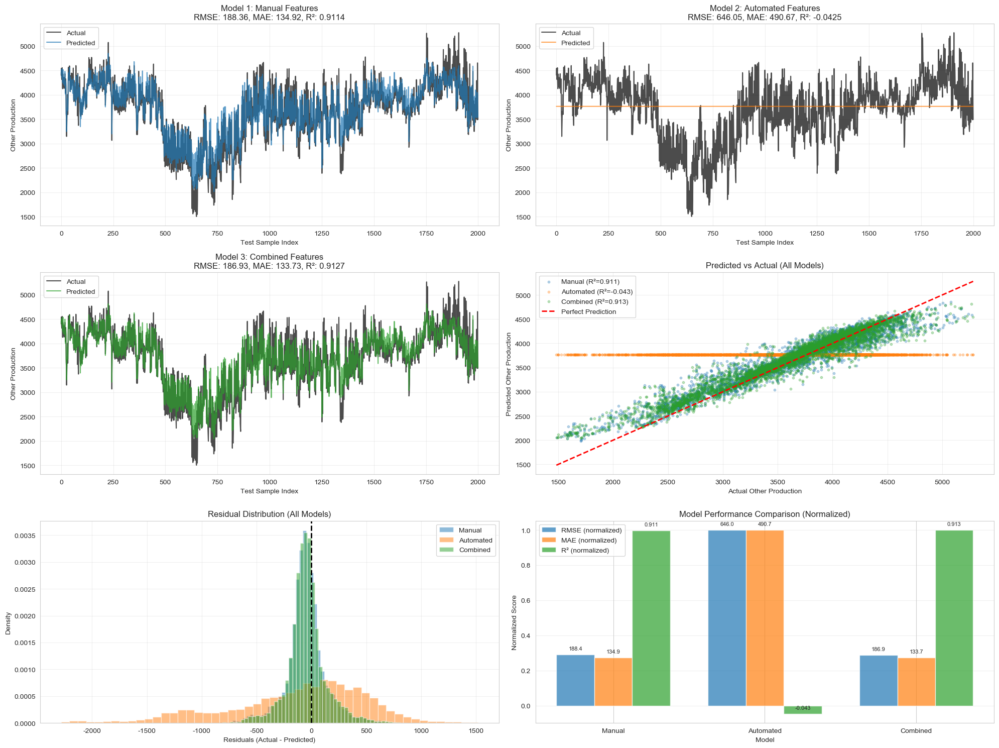

In [38]:
# Comprehensive Visualization of Model Results
if all_results is not None and len(all_results) > 0:
    print("=" * 60)
    print("Model Evaluation and Visualization")
    print("=" * 60)
    
    # Create figure with subplots
    fig = plt.figure(figsize=(20, 15))
    
    # ============================================================================
    # 1. Time Series: Predictions vs Actual for each model
    # ============================================================================
    num_models = len(all_results)
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c']
    model_names = list(all_results.keys())
    
    # Plot 1: Time series comparison for each model
    for idx, (model_name, results) in enumerate(all_results.items()):
        ax = plt.subplot(3, 2, idx + 1)
        
        y_test = results['y_test'].values
        y_pred = results['predictions']
        
        # Sample data for visualization if too large (show last 2000 points or all if less)
        sample_size = min(2000, len(y_test))
        if len(y_test) > sample_size:
            sample_idx = np.linspace(0, len(y_test) - 1, sample_size, dtype=int)
            y_test_plot = y_test[sample_idx]
            y_pred_plot = y_pred[sample_idx] if isinstance(y_pred, np.ndarray) else y_pred.iloc[sample_idx].values
            x_plot = np.arange(sample_size)
        else:
            y_test_plot = y_test
            y_pred_plot = y_pred if isinstance(y_pred, np.ndarray) else y_pred.values
            x_plot = np.arange(len(y_test))
        
        ax.plot(x_plot, y_test_plot, label='Actual', alpha=0.7, linewidth=1.5, color='black')
        ax.plot(x_plot, y_pred_plot, label='Predicted', alpha=0.7, linewidth=1.5, color=colors[idx])
        ax.set_title(f'Model {idx+1}: {model_name.capitalize()} Features\n'
                    f'RMSE: {results["rmse"]:.2f}, MAE: {results["mae"]:.2f}, R²: {results["r2"]:.4f}',
                    fontsize=12, fontweight='bold')
        ax.set_xlabel('Test Sample Index', fontsize=10)
        ax.set_ylabel('Other Production', fontsize=10)
        ax.legend(loc='best')
        ax.grid(True, alpha=0.3)
    
    # ============================================================================
    # 2. Scatter Plot: Predicted vs Actual
    # ============================================================================
    ax = plt.subplot(3, 2, 4)
    for idx, (model_name, results) in enumerate(all_results.items()):
        y_test = results['y_test'].values
        y_pred = results['predictions']
        if not isinstance(y_pred, np.ndarray):
            y_pred = y_pred.values
        
        # Sample for scatter plot if too large
        if len(y_test) > 5000:
            sample_idx = np.random.choice(len(y_test), 5000, replace=False)
            y_test_scatter = y_test[sample_idx]
            y_pred_scatter = y_pred[sample_idx]
        else:
            y_test_scatter = y_test
            y_pred_scatter = y_pred
        
        ax.scatter(y_test_scatter, y_pred_scatter, alpha=0.3, s=10, 
                  label=f'{model_name.capitalize()} (R²={results["r2"]:.3f})', color=colors[idx])
    
    # Perfect prediction line
    min_val = min([min(results['y_test'].values) for results in all_results.values()])
    max_val = max([max(results['y_test'].values) for results in all_results.values()])
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', linewidth=2, label='Perfect Prediction')
    ax.set_xlabel('Actual Other Production', fontsize=10)
    ax.set_ylabel('Predicted Other Production', fontsize=10)
    ax.set_title('Predicted vs Actual (All Models)', fontsize=12, fontweight='bold')
    ax.legend(loc='best')
    ax.grid(True, alpha=0.3)
    
    # ============================================================================
    # 3. Residual Distribution
    # ============================================================================
    ax = plt.subplot(3, 2, 5)
    for idx, (model_name, results) in enumerate(all_results.items()):
        y_test = results['y_test'].values
        y_pred = results['predictions']
        if not isinstance(y_pred, np.ndarray):
            y_pred = y_pred.values
        
        residuals = y_test - y_pred
        ax.hist(residuals, bins=50, alpha=0.5, label=model_name.capitalize(), color=colors[idx], density=True)
    
    ax.axvline(x=0, color='black', linestyle='--', linewidth=2)
    ax.set_xlabel('Residuals (Actual - Predicted)', fontsize=10)
    ax.set_ylabel('Density', fontsize=10)
    ax.set_title('Residual Distribution (All Models)', fontsize=12, fontweight='bold')
    ax.legend(loc='best')
    ax.grid(True, alpha=0.3)
    
    # ============================================================================
    # 4. Metrics Comparison
    # ============================================================================
    ax = plt.subplot(3, 2, 6)
    model_labels = [m.capitalize() for m in model_names]
    rmse_values = [all_results[m]['rmse'] for m in model_names]
    mae_values = [all_results[m]['mae'] for m in model_names]
    r2_values = [all_results[m]['r2'] for m in model_names]
    
    x = np.arange(len(model_labels))
    width = 0.25
    
    # Normalize metrics for comparison (0-1 scale)
    rmse_norm = np.array(rmse_values) / max(rmse_values)
    mae_norm = np.array(mae_values) / max(mae_values)
    r2_norm = np.array(r2_values) / max(r2_values) if max(r2_values) > 0 else np.array(r2_values)
    
    ax.bar(x - width, rmse_norm, width, label='RMSE (normalized)', color=colors[0], alpha=0.7)
    ax.bar(x, mae_norm, width, label='MAE (normalized)', color=colors[1], alpha=0.7)
    ax.bar(x + width, r2_norm, width, label='R² (normalized)', color=colors[2], alpha=0.7)
    
    ax.set_xlabel('Model', fontsize=10)
    ax.set_ylabel('Normalized Score', fontsize=10)
    ax.set_title('Model Performance Comparison (Normalized)', fontsize=12, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(model_labels)
    ax.legend(loc='best')
    ax.grid(True, alpha=0.3, axis='y')
    
    # Add actual values as text
    for i, (rmse, mae, r2) in enumerate(zip(rmse_values, mae_values, r2_values)):
        ax.text(i - width, rmse_norm[i] + 0.02, f'{rmse:.1f}', ha='center', va='bottom', fontsize=8)
        ax.text(i, mae_norm[i] + 0.02, f'{mae:.1f}', ha='center', va='bottom', fontsize=8)
        ax.text(i + width, r2_norm[i] + 0.02, f'{r2:.3f}', ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.savefig('eda_plots/automl_model_comparison.png', dpi=300, bbox_inches='tight')
    print("\n✓ Visualization saved to 'eda_plots/automl_model_comparison.png'")
    plt.show()
    
    # ============================================================================
    # Additional: Detailed time series for best model
    # ============================================================================
    # Find best model by R² score
    best_model_name = max(all_results.keys(), key=lambda k: all_results[k]['r2'])
    best_results = all_results[best_model_name]
    
    fig, axes = plt.subplots(2, 1, figsize=(16, 10))
    
    y_test_best = best_results['y_test'].values
    y_pred_best = best_results['predictions']
    if not isinstance(y_pred_best, np.ndarray):
        y_pred_best = y_pred_best.values
    
    # Plot 1: Full time series
    axes[0].plot(y_test_best, label='Actual', alpha=0.7, linewidth=1, color='black')
    axes[0].plot(y_pred_best, label='Predicted', alpha=0.7, linewidth=1, color='#2ca02c')
    axes[0].set_title(f'Best Model: {best_model_name.capitalize()} - Full Test Set\n'
                      f'RMSE: {best_results["rmse"]:.2f}, MAE: {best_results["mae"]:.2f}, R²: {best_results["r2"]:.4f}',
                      fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Test Sample Index', fontsize=12)
    axes[0].set_ylabel('Other Production', fontsize=12)
    axes[0].legend(loc='best', fontsize=11)
    axes[0].grid(True, alpha=0.3)
    
    # Plot 2: Zoomed in view (first 1000 points)
    zoom_size = min(1000, len(y_test_best))
    axes[1].plot(y_test_best[:zoom_size], label='Actual', alpha=0.8, linewidth=1.5, color='black')
    axes[1].plot(y_pred_best[:zoom_size], label='Predicted', alpha=0.8, linewidth=1.5, color='#2ca02c')
    axes[1].set_title(f'Best Model: {best_model_name.capitalize()} - Zoomed View (First {zoom_size} samples)',
                     fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Test Sample Index', fontsize=12)
    axes[1].set_ylabel('Other Production', fontsize=12)
    axes[1].legend(loc='best', fontsize=11)
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('eda_plots/automl_best_model_detail.png', dpi=300, bbox_inches='tight')
    print("✓ Best model detailed visualization saved to 'eda_plots/automl_best_model_detail.png'")
    plt.show()
    
    print("\n" + "=" * 60)
    print("VISUALIZATION SUMMARY")
    print("=" * 60)
    print(f"Best Model: {best_model_name.capitalize()}")
    print(f"  - RMSE: {best_results['rmse']:.2f}")
    print(f"  - MAE: {best_results['mae']:.2f}")
    print(f"  - R² Score: {best_results['r2']:.4f}")
    print(f"  - Number of features: {len(best_results['features'])}")
    
else:
    print("⚠ No model results available for visualization.")
    print("Please run the AutoML training cells first.")


## 8.4 Combined 模型内部各个模型对比

**Purpose**: Display comparison of individual models within the Combined AutoGluon ensemble using `predictor.leaderboard(test_data, silent=True)`.

**功能**: 使用 `predictor.leaderboard(test_data, silent=True)` 展示 Combined 混合模型内部各个基础模型的性能对比。


In [ ]:
# ============================================================================
# 展示 Combined 模型中的各个模型对比
# Display individual model comparison within Combined AutoGluon ensemble
# ============================================================================

if all_results is not None and 'combined' in all_results:
    predictor = all_results['combined'].get('predictor')
    
    if predictor is not None and 'combined' in feature_sets_data:
        # 准备测试数据
        test_data = feature_sets_data['combined']['X_test'].copy()
        test_data['Other_Production'] = feature_sets_data['combined']['y_test'].values
        
        # 使用 leaderboard() 方法展示所有模型的性能
        print("=" * 80)
        print("Combined 模型内部各个模型对比 (Combined Model Individual Model Comparison)")
        print("=" * 80)
        leaderboard = predictor.leaderboard(test_data, silent=True)
        print(leaderboard)
    else:
        print("⚠ Combined 模型不可用")
else:
    print("⚠ 没有可用的 Combined 模型结果")
    print("⚠ 请先运行 AutoML 训练单元格")
